# Rainfall Weather Forecasting Project

## Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

## Dataset Description
The Dataset contains about 10 years of daily weather observations of different locations in Australia.

## Attributes Description
Date- The date of observation.

Location- The common name of the location of the weather station.

MinTemp- The minimum temperature in degrees celsius.

MaxTemp- The maximum temperature in degrees celsius.

Rainfall- The amount of rainfall recorded for the day in mm.

Evaporation- The so-called Class A pan evaporation (mm) in the 24 hours to 9 am.

Sunshine- The number of hours of bright sunshine in the day.

WindGustDir- The direction of the strongest wind gust in the 24 hours to midnight.

WindGustSpeed- The speed (km/h) of the strongest wind gust in the 24 hours to midnight.

WindDir9am- Direction of the wind at 9 am.

WindDir3pm- Direction of the wind at 3 pm.

WindSpeed9am- Wind speed (km/hr) averaged over 10 minutes prior to 9 am.

WindSpeed3pm- Wind speed (km/hr) averaged over 10 minutes prior to 3 pm.

Humidity9am- Humidity (percent) at 9 am.

Humidity3pm- Humidity (percent) at 3 pm.

Pressure9am- Atmospheric pressure (hpa) reduced to mean sea level at 9 am.

Pressure3pm- Atmospheric pressure (hpa) reduced to mean sea level at 3 pm.

Cloud9am- Fraction of sky obscured by cloud at 9 am. 

Cloud3pm- Fraction of sky obscured by cloud.

Temp9am- Temperature (degrees C) at 9 am.

Temp3pm- Temperature (degrees C) at 3 pm.

RainToday-Boolean- 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0.

RainTomorrow- The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


## Objective
The objective of this project is to forecast 'whether or not it will rain tomorrow' and 'how much rainfall could be there' based on the details provided in the dataset. In this project, the prediction of 'whether or not it will rain tomorrow' and 'how much rainfall could be there' involves the implementation of two separate models, classification model for predicting 'whether or not it will rain tomorrow' and regression model for predicting 'how much rainfall could be there'.

##  Features and the Target Variable for Predicting 'Whether or Not It Will Rain Tomorrow'

### Features
Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday

### Target variable
RainTomorrow

## Features and the Target Variable for Predicting  'How Much Rainfall Could Be There'

### Features
Date, Location, MinTemp, MaxTemp, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow

### Target variable
Rainfall

# Importing Libraries

In [1]:
# Numerical computation and data manipulation 
import numpy as np
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Z-score normalization and Box-Cox transformation
from scipy.stats import zscore, yeojohnson

# Suppress warnings
import warnings 
warnings.filterwarnings('ignore')

# Data preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# SMOTE for class imbalance problem
from imblearn.over_sampling import SMOTE

# VIF calculation
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Regression models
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso, ElasticNet

# K-Nearest Neighbors Classifier and Regressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

# Gausian Naive Bayes Classifier
from sklearn.naive_bayes import GaussianNB

# Decision Tree Classifier and Regressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

# Support Vector Classifier and Regressor
from sklearn.svm import SVC, SVR

# Ensemble Algorithms
from sklearn.ensemble import (RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, AdaBoostClassifier, 
BaggingClassifier, RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor, BaggingRegressor)

# XGBoost for boosting
import xgboost as xgb

# Metrics for checking the performance of models
from sklearn.metrics import (accuracy_score, confusion_matrix, classification_report, mean_squared_error, mean_absolute_error, 
r2_score)
from sklearn.metrics import auc, roc_curve, RocCurveDisplay

# Data splitting and validation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, GridSearchCV

# Saving and loading models
import joblib

# Importing Dataset

In [2]:
# Load data from CSV into DataFrame
df = pd.read_csv('Rainfall_Weather_Forecasting_Dataset.csv')

In [3]:
# Display first 5 rows of the dataframe
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
# Display last 5 rows of the dataframe
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


# Exploratory Data Analysis

In [5]:
# Display shape of the dataframe
df.shape

(8425, 23)

Dataframe has 8425 rows and 23 columns.

In [6]:
# Display the names of the columns 
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [7]:
# Display the datatype of each column
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

Columns like 'Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', and 'RainTomorrow' have 'object' data type but datatype for 'Date' column should be datetime not object.

Columns such as 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', and 'Temp3pm' have 'float64' data type.

In [8]:
# Converting datatype of 'Date' column to datetime datatype
df['Date'] = pd.to_datetime(df['Date'])

In [9]:
# Again checking the datatype for each column
df.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

In [10]:
# Extracting year, month, and day from 'Date' column and storing in separate columns
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

The year, month, and day have been extracted from the 'Date' column, making it redundant to keep it in the dataset.

In [11]:
# Dropping 'Date' column from the dataset
df.drop('Date', inplace = True, axis = 1)

In [12]:
# Checking for the shape of dataset after updation
df.shape

(8425, 25)

Now, dataset has 8425 rows and 25 columns.

## Data Preprocessing

In [13]:
# Checking for if any ' ', NA, -, or - exist in dataset.
df.isin([' ','NA','-','?']).sum().any()

False

No whitespace,?, NA, or - present in the dataset.

In [14]:
# Checking for the duplicated rows in the dataset
df.duplicated().sum()

1663

Duplicated rows present in the dataset.

In [15]:
# Dropping duplicated rows
df.drop_duplicates(keep = 'first', inplace = True)

In [16]:
# Again checking for the duplicated rows in the dataset
df.duplicated().sum()

0

Now, no duplicated rows present in the dataset.

In [17]:
# Display shape of the dataframe after dropping duplicated rows
df.shape

(6762, 25)

Now, dataset has 6762 rows and 25 columns.

In [18]:
# Checking for the null values in the dataset
df.isnull().sum()

Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
Year                0
Month               0
Day                 0
dtype: int64

Yes, null values are present in the various columns.

In [19]:
# Calculate the percentage of missing data for each column
missing_percentage = (df.isnull().mean() * 100).round(2)

# Create a DataFrame to display the results
missing_data_info = pd.DataFrame({'Missing Values': df.isnull().sum(), '% Missing Data': missing_percentage})

# Sort the missing data information in descending order by '% Missing Data'
missing_data_info = missing_data_info.sort_values(by='% Missing Data', ascending=False)

# Print the sorted missing data information
print(missing_data_info)

               Missing Values  % Missing Data
Sunshine                 3236           47.86
Evaporation              2921           43.20
Cloud3pm                 1902           28.13
Cloud9am                 1866           27.60
Pressure3pm              1311           19.39
Pressure9am              1308           19.34
WindGustDir               942           13.93
WindGustSpeed             942           13.93
WindDir9am                794           11.74
WindDir3pm                294            4.35
RainTomorrow              138            2.04
RainToday                 138            2.04
Rainfall                  138            2.04
WindSpeed3pm              100            1.48
Humidity3pm                96            1.42
Temp3pm                    92            1.36
MinTemp                    70            1.04
WindSpeed9am               63            0.93
MaxTemp                    57            0.84
Humidity9am                54            0.80
Temp9am                    51     

Columns such as 'Location', 'Day', 'Month', and 'Year' columns do not have null values.

Numerical columns such as 'MinTemp', 'MaxTemp', 'Temp9am', 'Temp3pm', 'Humidity9am', 'Humidity3pm', 'WindSpeed9am', 'WindSpeed3pm', and 'Rainfall' containing small number of missing values and columns such as 'Evaporation', 'Sunshine', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'WindGustSpeed', and 'Cloud3pm' containing large number of missing values. Imputing missing values with the mean or median in these columns will depend on the distribution, if the distribution is approximately normal then impute with mean and if the distribution is skewed then with median.

Categorical columns such as 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', and 'RainTomorrow' contain null values imputing missing values with mode will be good option.

In [20]:
# Checking for the distribution of data in columns for missing values imputation
columns_to_check = ['MinTemp', 'MaxTemp', 'Temp9am', 'Temp3pm', 'Humidity9am', 'Humidity3pm', 'WindSpeed9am', 'WindSpeed3pm',
                    'Rainfall', 'Evaporation', 'Sunshine', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'WindGustSpeed', 'Cloud3pm']
# Checking for the skewness using skew() method
df[columns_to_check].skew()

MinTemp          -0.083271
MaxTemp           0.326215
Temp9am          -0.047034
Temp3pm           0.345725
Humidity9am      -0.255152
Humidity3pm       0.149786
WindSpeed9am      0.952569
WindSpeed3pm      0.545718
Rainfall         13.510350
Evaporation      10.216570
Sunshine         -0.637137
Pressure9am       0.019836
Pressure3pm       0.038601
Cloud9am         -0.183033
WindGustSpeed     0.724065
Cloud3pm         -0.137486
dtype: float64

Columns such as 'MinTemp', 'Temp9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', and 'Cloud3pm' have skewness values close to zero, suggesting that they are relatively normally distributed.

Columns such as 'MaxTemp', 'Temp3pm', 'Humidity9am', 'WindSpeed9am', 'WindSpeed3pm', 'Rainfall', 'Evaporation', 'Sunshine', 'Cloud9am', and 'WindGustSpeed' have either positve or negative skewness.

## Imputing Missing Values

In [21]:
# Imputing columns containing null values with mean or mode
columns_to_impute_with_mean = ['MinTemp', 'Temp9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud3pm']
for i in columns_to_impute_with_mean:
    df[i].fillna(df[i].mean(), inplace = True)
    
columns_to_impute_with_median = ['MaxTemp', 'Temp3pm', 'Humidity9am', 'WindSpeed9am', 'WindSpeed3pm', 'Rainfall', 'Evaporation',
                                 'Sunshine', 'Cloud9am', 'WindGustSpeed']
for i in columns_to_impute_with_median:
    df[i].fillna(df[i].median(), inplace = True)

columns_to_impute_with_mode = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
for i in columns_to_impute_with_mode:
    df[i].fillna(df[i].mode()[0], inplace = True)

In [22]:
# Again checking for the null values
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64

Now, no null values present in the dataset.

In [23]:
# Display dataframe after updation
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,4.6,9.0,W,44.0,W,WNW,...,1007.1,8.0,4.320988,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,4.6,9.0,WNW,44.0,NNW,WSW,...,1007.8,5.0,4.320988,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,4.6,9.0,WSW,46.0,W,WSW,...,1008.7,5.0,2.000000,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,4.6,9.0,NE,24.0,SE,E,...,1012.8,5.0,4.320988,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,4.6,9.0,W,41.0,ENE,NW,...,1006.0,7.0,8.000000,17.8,29.7,No,No,2008,12,5


Now dataframe has 6762 rows and 25 columns.

In [24]:
# Checking for the number of unique values present inside each column
df.nunique()

Location          12
MinTemp          286
MaxTemp          331
Rainfall         250
Evaporation      116
Sunshine         140
WindGustDir       16
WindGustSpeed     52
WindDir9am        16
WindDir3pm        16
WindSpeed9am      34
WindSpeed3pm      35
Humidity9am       90
Humidity3pm       95
Pressure9am      385
Pressure3pm      375
Cloud9am           9
Cloud3pm          10
Temp9am          305
Temp3pm          328
RainToday          2
RainTomorrow       2
Year              10
Month             12
Day               31
dtype: int64

Location: 12 unique values (different locations).

MinTemp: 286 unique values (minimum temperature).

MaxTemp: 331 unique values (maximum temperature).

Rainfall: 250 unique values (rainfall amount).

Evaporation: 116 unique values (evaporation amount).

Sunshine: 140 unique values (sunshine hours).

WindGustDir: 16 unique values (wind gust directions).

WindGustSpeed: 52 unique values (wind gust speeds).

WindDir9am: 16 unique values (wind directions at 9 am).

WindDir3pm: 16 unique values (wind directions at 3 pm).

WindSpeed9am: 34 unique values (wind speeds at 9 am).

WindSpeed3pm: 35 unique values (wind speeds at 3 pm).

Humidity9am: 90 unique values (humidity at 9 am).

Humidity3pm: 95 unique values (humidity at 3 pm).

Pressure9am: 385 unique values (pressure at 9 am).

Pressure3pm: 375 unique values (pressure at 3 pm).

Cloud9am: 9 unique values (cloud cover at 9 am).

Cloud3pm: 10 unique values (cloud cover at 3 pm).

Temp9am: 305 unique values (temperature at 9 am).

Temp3pm: 328 unique values (temperature at 3 pm).

RainToday: 2 unique values (indicator of rain today).

RainTomorrow: 2 unique values (indicator of rain tomorrow).

Year: 10 unique values (years).

Month: 12 unique values (months).

Day: 31 unique values (days).

In [25]:
# Separating numerical columns and categorical columns for further data analysis
categorical_columns = []
numerical_columns = []

for i in df.columns:
    if df[i].dtypes == 'object':
        categorical_columns.append(i)
    elif df[i].dtypes == 'int64' or df[i].dtypes == 'float64':
        numerical_columns.append(i)

In [26]:
# Display the list of categorical columns
categorical_columns

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [27]:
# Display the list of numerical columns
numerical_columns

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Year',
 'Month',
 'Day']

In [28]:
# Display the lengths of both the lists
print("No. of categorical columns:", len(categorical_columns))
print("No. of numerical columns:", len(numerical_columns))

No. of categorical columns: 6
No. of numerical columns: 19


In [29]:
# Display unique values present inside each categorical column
for i in categorical_columns:
    print(i, ":")
    print(df[i].unique())
    print("\n")

Location :
['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru']


WindGustDir :
['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'E' 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'SSW']


WindDir9am :
['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' 'N' 'SSW' 'WSW' 'ESE' 'E' 'NW'
 'WNW' 'NNE']


WindDir3pm :
['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' 'NE']


RainToday :
['No' 'Yes']


RainTomorrow :
['No' 'Yes']




Location: There are 12 unique values representing different locations, including Albury, CoffsHarbour, Newcastle, Penrith, Williamtown, Wollongong, Melbourne, Brisbane, Adelaide, PerthAirport, Darwin, and Uluru.

WindGustDir: This column has 16 unique values indicating wind gust directions, including W, WNW, WSW, NE, NNW, N, NNE, SW, E, ENE, SSE, S, NW, SE, ESE, and SSW.

WindDir9am: There are 16 unique values in this column representing wind directions at 9 am, including W, NNW, SE, ENE, SW, SSE, S, NE, N, SSW, WSW, ESE, E, NW, WNW, and NNE.

WindDir3pm: This column contains 16 unique values indicating wind directions at 3 pm, including WNW, WSW, E, NW, W, SSE, ESE, ENE, NNW, SSW, SW, SE, N, S, NNE, and NE.

RainToday: There are 2 unique values in this column, representing whether it rained on the day (Yes or No).

RainTomorrow: This column also has 2 unique values, indicating whether it will rain tomorrow (Yes or No).

In [30]:
# Display value count for each unique value present in the categoical column
for i in categorical_columns:
    print(df[i].value_counts())
    print("\n")

PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


E      1460
SW      465
N       459
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: WindGustDir, dtype: int64


N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: WindDir9am, dtype: int64


SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64


No     5190
Yes    1572
Name: RainToday, dtype: int64


N

Location: This column indicates various locations, with PerthAirport having the highest count (1204 occurrences), followed by Albury (907), Newcastle (822), Melbourne (811), Williamtown (615), CoffsHarbour (611), Brisbane (579), Penrith (482), Darwin (250), Wollongong (237), Adelaide (205), and Uluru (39).

WindGustDir: There are 16 unique values representing wind gust directions. The most frequent direction is 'E' (1460 occurrences), followed by 'SW' (465), 'N' (459), 'W' (434), 'WSW' (420), 'WNW' (398), 'SSE' (390), 'S' (376), 'SE' (370), 'ENE' (357), 'NE' (300), 'SSW' (299), 'NW' (296), 'NNE' (287), 'ESE' (267), and 'NNW' (184).

WindDir9am: This column indicates wind directions at 9 am. The most frequent direction is 'N' (1403 occurrences), followed by 'SW' (590), 'NW' (463), 'SE' (439), 'ENE' (397), 'WSW' (394), 'SSW' (368), 'NE' (364), 'E' (338), 'NNE' (337), 'S' (324), 'WNW' (301), 'SSE' (300), 'W' (299), 'ESE' (229), and 'NNW' (216).

WindDir3pm: There are 16 unique values representing wind directions at 3 pm. The most frequent direction is 'SE' (971 occurrences), followed by 'WSW' (499), 'S' (493), 'NE' (480), 'SW' (428), 'SSE' (421), 'NW' (400), 'W' (399), 'E' (392), 'WNW' (389), 'ESE' (363), 'N' (354), 'ENE' (348), 'NNE' (305), 'SSW' (277), and 'NNW' (243).

RainToday: There are two unique values in this column, 'No' (5190 occurrences) and 'Yes' (1572 occurrences), representing whether it rained on the day.

RainTomorrow: This column also contains two unique values, 'No' (5190 occurrences) and 'Yes' (1572 occurrences), indicating whether it will rain tomorrow.

In [31]:
# Display unique values present inside each numerical column
for i in numerical_columns:
    print(i, ":")
    print(df[i].unique())
    print("\n")

MinTemp :
[13.4         7.4        12.9         9.2        17.5        14.6
 14.3         7.7         9.7        13.1        15.9        12.6
  8.4         9.8        14.1        13.5        11.2        11.5
 17.1        20.5        15.3        16.2        16.9        20.1
 19.7        12.5        12.         11.3         9.6        10.5
 12.3        13.7        16.1        14.         17.         17.3
 17.2        17.4        19.8        14.9        13.9        18.6
 19.3        24.4        18.8        20.8        15.7        18.5
 20.4        21.8        22.3        22.         28.         21.5
 21.7        23.5        28.3        18.4        12.4        13.3
 18.         18.7        15.5         8.9        15.         15.4
 16.         12.8        13.2        13.8         7.6         8.3
 11.         20.9        16.4        10.          8.8         9.3
 14.4        10.8        10.1         9.1        10.4        12.2
 10.7         7.8         8.1         7.5         8.2        11.6


Except Year, Month and Day columns each column contains a wide array of distinct and diverse values.

In [32]:
# Display value count for each unique value present in the numerical column
for i in numerical_columns:
    print(df[i].value_counts())
    print("\n")

 13.109145    70
 13.200000    58
 12.000000    57
 14.800000    53
 12.700000    53
              ..
-1.200000      1
-1.500000      1
-1.700000      1
-0.800000      1
 26.000000     1
Name: MinTemp, Length: 286, dtype: int64


23.5    99
19.0    66
19.8    62
22.3    54
23.8    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64


0.0      4472
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
40.0        1
Name: Rainfall, Length: 250, dtype: int64


4.6      3010
4.0       141
3.0       125
2.2       118
2.4       116
         ... 
145.0       1
33.8        1
59.2        1
20.8        1
0.7         1
Name: Evaporation, Length: 116, dtype: int64


9.0     3281
0.0      119
11.1      61
11.0      59
11.2      59
        ... 
2.5        5
13.6       4
13.8       2
13.9       2
13.5       1
Name: Sunshine, Length: 140, dtype: int64


37.0     1274
39.0  

The occurrence pattern of values in each column displays a wide and diverse array of distinct values.

In [33]:
# Display dataframe's details, such as columns' data type and no. of non_null values
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   object 
 1   MinTemp        6762 non-null   float64
 2   MaxTemp        6762 non-null   float64
 3   Rainfall       6762 non-null   float64
 4   Evaporation    6762 non-null   float64
 5   Sunshine       6762 non-null   float64
 6   WindGustDir    6762 non-null   object 
 7   WindGustSpeed  6762 non-null   float64
 8   WindDir9am     6762 non-null   object 
 9   WindDir3pm     6762 non-null   object 
 10  WindSpeed9am   6762 non-null   float64
 11  WindSpeed3pm   6762 non-null   float64
 12  Humidity9am    6762 non-null   float64
 13  Humidity3pm    6762 non-null   float64
 14  Pressure9am    6762 non-null   float64
 15  Pressure3pm    6762 non-null   float64
 16  Cloud9am       6762 non-null   float64
 17  Cloud3pm       6762 non-null   float64
 18  Temp9am 

In [34]:
# Display summary statistics of the dataframe
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,6762.0,13.109145,5.540667,-2.0,9.0,13.109145,17.4,28.5
MaxTemp,6762.0,24.093301,6.130367,8.2,19.6,23.500000,28.4,45.5
Rainfall,6762.0,2.723410,10.490138,0.0,0.0,0.000000,0.8,371.0
Evaporation,6762.0,4.998980,3.361770,0.0,4.0,4.600000,5.0,145.0
Sunshine,6762.0,8.421665,2.789228,0.0,8.8,9.000000,9.2,13.9
WindGustSpeed,6762.0,38.702159,13.393977,7.0,30.0,37.000000,46.0,107.0
WindSpeed9am,6762.0,12.765602,9.789075,0.0,6.0,11.000000,19.0,63.0
WindSpeed3pm,6762.0,17.562703,9.548883,0.0,11.0,17.000000,24.0,83.0
Humidity9am,6762.0,67.510500,17.182756,10.0,56.0,68.000000,80.0,100.0
Humidity3pm,6762.0,50.467147,18.498341,6.0,38.0,50.000000,62.0,99.0


MinTemp:
The minimum temperature (MinTemp) column has a range from -2.0°C to 28.5°C, with a mean temperature of approximately 13.11°C. The 25th percentile is 9.00°C, the median is 13.11°C, and the 75th percentile is 17.40°C.

MaxTemp:
The maximum temperature (MaxTemp) column ranges from 8.2°C to 45.5°C, with a mean temperature of about 24.10°C. The 25th percentile is 19.60°C, the median is 23.50°C, and the 75th percentile is 28.40°C.

Rainfall:
The Rainfall column spans from 0.0 mm to 371.0 mm, with an average rainfall of approximately 2.78 mm. The 25th percentile is 0.00 mm, the median is 0.00 mm, and the 75th percentile is 1.20 mm.

Evaporation:
The Evaporation column has values ranging from 0.0 mm to 145.0 mm, with a mean of about 5.30 mm. All percentiles have the same value of 5.30 mm.

Sunshine:
Sunshine values vary from 0.0 hours to 13.9 hours, with an average of around 7.89 hours. The 25th percentile is 7.89 hours, the median is 7.89 hours, and the 75th percentile is 9.20 hours.

WindGustSpeed:
WindGustSpeed has a range from 7.0 km/h to 107.0 km/h, with a mean speed of approximately 38.98 km/h. The 25th percentile is 30.00 km/h, the median is 38.98 km/h, and the 75th percentile is 46.00 km/h.

WindSpeed9am:
The WindSpeed9am column shows values from 0.0 km/h to 63.0 km/h, with a mean speed of about 12.78 km/h. The 25th percentile is 6.00 km/h, the median is 11.00 km/h, and the 75th percentile is 19.00 km/h.

WindSpeed3pm:
WindSpeed3pm ranges from 0.0 km/h to 83.0 km/h, with a mean speed of approximately 17.57 km/h. The 25th percentile is 11.00 km/h, the median is 17.00 km/h, and the 75th percentile is 24.00 km/h.

Humidity9am:
Humidity9am has values between 10% and 100%, with a mean humidity of around 67.51%. The 25th percentile is 56%, the median is 68%, and the 75th percentile is 80%.

Humidity3pm:
Humidity3pm spans from 6% to 99%, with a mean humidity of about 50.47%. The 25th percentile is 38%, the median is 50%, and the 75th percentile is 62%.

Pressure9am:
Pressure9am varies from 989.8 hPa to 1039.0 hPa, with a mean pressure of approximately 1017.63 hPa. The 25th percentile is 1014.20 hPa, the median is 1017.63 hPa, and the 75th percentile is 1020.90 hPa.

Pressure3pm:
Pressure3pm ranges from 982.9 hPa to 1036.0 hPa, with a mean pressure of about 1015.12 hPa. The 25th percentile is 1011.50 hPa, the median is 1015.12 hPa, and the 75th percentile is 1018.40 hPa.

Cloud9am:
Cloud9am values vary from 0.0 (clear sky) to 8.0 (completely cloudy), with a mean value of approximately 4.34. The 25th percentile is 2.0, the median is 4.34, and the 75th percentile is 7.0.

Cloud3pm:
Cloud3pm has values between 0.0 (clear sky) and 8.0 (completely cloudy), with a mean value of about 4.32. The 25th percentile is 3.0, the median is 4.32, and the 75th percentile is 6.0.

Temp9am:
The temperature at 9 am (Temp9am) ranges from 1.9°C to 39.4°C, with a mean temperature of approximately 17.90°C. The 25th percentile is 13.90°C, the median is 17.90°C, and the 75th percentile is 22.20°C.

Temp3pm:
The temperature at 3 pm (Temp3pm) varies from 7.3°C to 44.1°C, with a mean temperature of about 22.71°C. The 25th percentile is 18.40°C, the median is 22.30°C, and the 75th percentile is 26.80°C.

Year:
The Year column spans from 2008 to 2017, with an average year of 2012.05. This indicates data covering a range of years.

Month:
The Month column ranges from 1 to 12, with an average month of 6.46. This represents different months of the year.

Day:
The Day column spans from 1 to 31, with an average day of 15.74. This indicates different days.

In [35]:
# Display summary statistics of the dataframe for categorical columns
df.describe(include = 'O')

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,6762,6762,6762,6762,6762,6762
unique,12,16,16,16,2,2
top,PerthAirport,E,N,SE,No,No
freq,1204,1460,1403,971,5190,5190


Location:
The 'Location' column has 12 unique values, with 'PerthAirport' being the most frequent location (appearing 1204 times). This suggests that the dataset contains weather data from multiple locations, with PerthAirport having the highest frequency.

WindGustDir:
In the 'WindGustDir' column, there are 16 unique wind gust directions. The most common wind gust direction is 'E' (East) with a frequency of 1460, indicating that this direction is the most prevalent in the dataset.

WindDir9am:
The 'WindDir9am' column contains 16 unique wind directions at 9 am. 'N' (North) is the most frequent direction, appearing 1403 times. This indicates that the North direction is the most common wind direction at 9 am.

WindDir3pm:
In the 'WindDir3pm' column, there are 16 unique wind directions at 3 pm. 'SE' (Southeast) is the most common direction with a frequency of 971, suggesting that Southeast is the prevailing wind direction at 3 pm.

RainToday:
The 'RainToday' column has 2 unique values, 'No' and 'Yes', indicating whether it rained on the day. 'No' is the most frequent value, occurring 5190 times, suggesting that rain is less common on the given days.

RainTomorrow:
The 'RainTomorrow' column also has 2 unique values, 'No' and 'Yes', indicating whether it will rain tomorrow. 'No' is the most frequent value, appearing 5190 times, which implies that most days do not have rain predicted for the following day.

# Data Visualization

In [36]:
sns.set(style = 'whitegrid')

## Univariate Analysis

### Count Plot

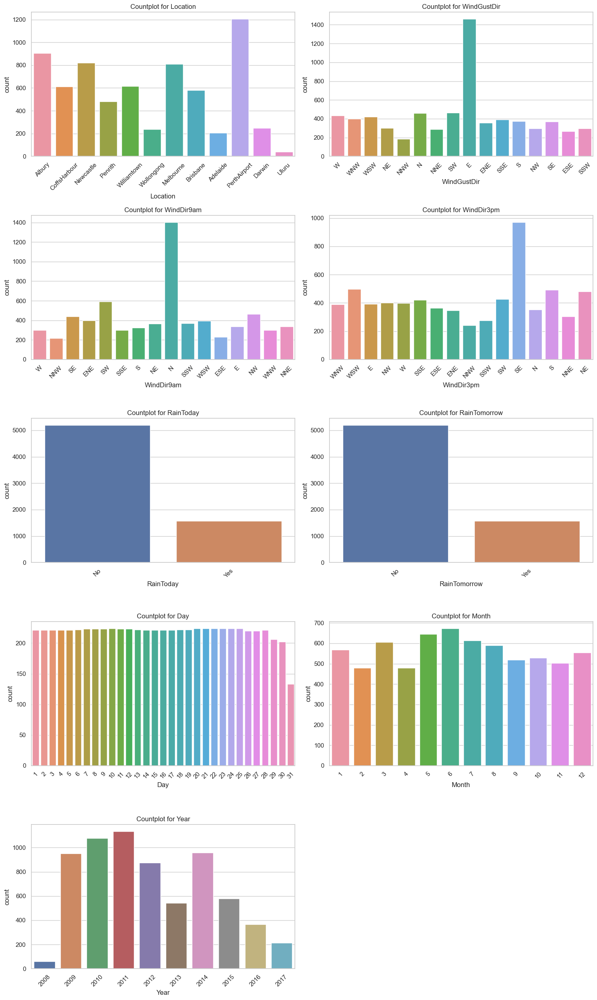

In [37]:
# Univariate analysis using count plot
columns_to_plot = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year']

rows = 5
columns = 2

plt.figure(figsize = (15, 25))

for i in range(0, len(columns_to_plot)):
    plt.subplot(rows, columns, i+1)
    sns.countplot(df[columns_to_plot[i]]) 
    plt.title("Countplot for " + columns_to_plot[i])
    plt.xticks(rotation = 45)
    plt.tight_layout()

plt.show()

### Observations:
#### Location
PerthAirport having the highest count (1204 occurrences), followed by Albury (907), Newcastle (822), Melbourne (811), Williamtown (615), CoffsHarbour (611), Brisbane (579), Penrith (482), Darwin (250), Wollongong (237), Adelaide (205), and Uluru (39).

#### WindGustDir
The most frequent direction is 'E' (1460 occurrences), followed by 'SW' (465), 'N' (459), 'W' (434), 'WSW' (420), 'WNW' (398), 'SSE' (390), 'S' (376), 'SE' (370), 'ENE' (357), 'NE' (300), 'SSW' (299), 'NW' (296), 'NNE' (287), 'ESE' (267), and 'NNW' (184).

#### WindDir9am
The most frequent direction is 'N' (1403 occurrences), followed by 'SW' (590), 'NW' (463), 'SE' (439), 'ENE' (397), 'WSW' (394), 'SSW' (368), 'NE' (364), 'E' (338), 'NNE' (337), 'S' (324), 'WNW' (301), 'SSE' (300), 'W' (299), 'ESE' (229), and 'NNW' (216).

#### WindDir3pm
The most frequent direction is 'SE' (971 occurrences), followed by 'WSW' (499), 'S' (493), 'NE' (480), 'SW' (428), 'SSE' (421), 'NW' (400), 'W' (399), 'E' (392), 'WNW' (389), 'ESE' (363), 'N' (354), 'ENE' (348), 'NNE' (305), 'SSW' (277), and 'NNW' (243).

#### RainToday
There are two unique values in this column, 'No' (5190 occurrences) and 'Yes' (1572 occurrences), representing whether it rained on the day.

#### RainTomorrow
This column also contains two unique values, 'No' (5190 occurrences) and 'Yes' (1572 occurrences), indicating whether it will rain tomorrow.

#### Year
2011 had the highest count with 1133 occurrences. 2008 had the lowest count, accounting for only 62 occurrences.

#### Month
June (Month 6) was the most prevalent with 673 occurrences. February (Month 2) had the fewest with 479 occurrences.

#### Day
The 10th and 23rd days both had the highest daily count, each with 224 occurrences. In contrast, the 31st day had the lowest count at 133 instances.

### Pie Chart

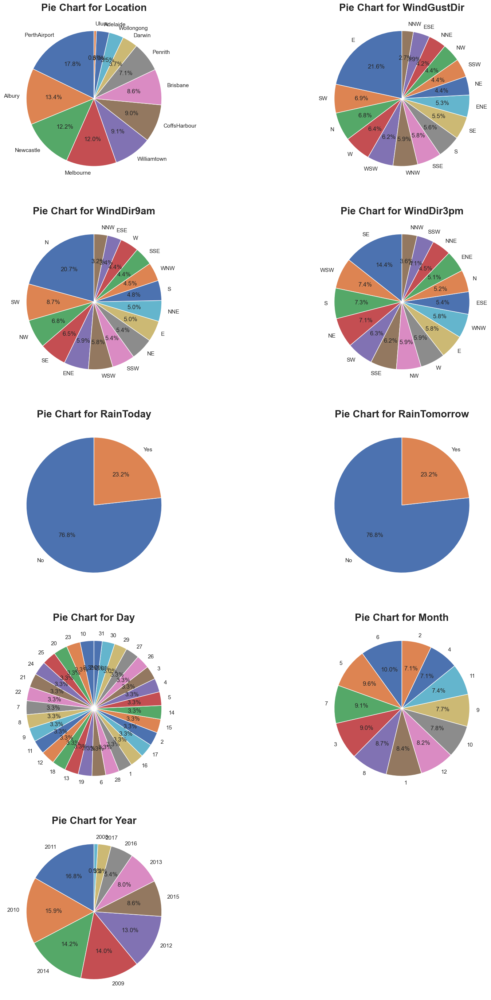

In [38]:
# Univariate analysis using pie chart
columns_to_plot = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year']
rows = 5
columns = 2
plt.figure(figsize = (20, 35))

for i in range(0, len(columns_to_plot)):
    plt.subplot(rows, columns, i + 1)
    category_counts = df[columns_to_plot[i]].value_counts()
    plt.title("Pie Chart for " + columns_to_plot[i])
    plt.pie(category_counts, labels = category_counts.index, autopct = '%1.1f%%', startangle = 90)
    plt.title("Pie Chart for " + columns_to_plot[i], fontsize = 20, fontweight = 'bold')

plt.show()

### Observations:
Location
PerthAirport leads with 17.8% of occurrences, followed by Albury (13.4%), Newcastle (12.2%), Melbourne (12.0%), Williamtown (9.1%), CoffsHarbour (9.0%), Brisbane (8.6%), Penrith (7.1%), Darwin (3.7%), Wollongong (3.5%), Adelaide (3.0%), and Uluru (0.6%).

#### WindGustDir
The most frequent wind direction is 'E' with 8.9% of occurrences, followed by 'SW' (8.0%), 'N' (7.9%), 'W' (7.5%), 'WSW' (7.2%), 'WNW' (6.8%), 'SSE' (6.7%), 'S' (6.5%), 'SE' (6.4%), 'ENE' (6.1%), 'NE' (5.2%), 'SSW' (5.1%), 'NW' (5.1%), 'NNE' (4.9%), 'ESE' (4.6%), and 'NNW' (3.2%).

#### WindDir9am
The most frequent wind direction is 'N' with 10.2% of occurrences, followed by 'SW' (9.9%), 'NW' (7.8%), 'SE' (7.4%), 'ENE' (6.7%), 'WSW' (6.6%), 'SSW' (6.2%), 'NE' (6.1%), 'E' (5.7%), 'NNE' (5.6%), 'S' (5.4%), 'WNW' (5.0%), 'SSE' (5.0%), 'W' (5.0%), 'ESE' (3.8%), and 'NNW' (3.6%).

#### WindDir3pm
The most frequent wind direction is 'SE' with 10.5% of occurrences, followed by 'WSW' (7.7%), 'S' (7.6%), 'NE' (7.4%), 'SW' (6.6%), 'SSE' (6.5%), 'NW' (6.2%), 'W' (6.2%), 'E' (6.1%), 'WNW' (6.0%), 'ESE' (5.6%), 'N' (5.5%), 'ENE' (5.4%), 'NNE' (4.7%), 'SSW' (4.3%), and 'NNW' (3.8%).

#### RainToday
'No' is the more frequent category, accounting for 76.3% of occurrences. 'Yes' constitutes 23.7% of the occurrences.

#### RainTomorrow
'No' is the majority with 76.3% of occurrences. 'Yes' accounts for 23.7% of the occurrences.

#### Day
Various days, from the 1st to the 31st, have fairly equal distribution, each around 3.3%, except for the 31st, which is at 2.0%.

#### Month
June (Month 6) is the most common month, making up 10.0% of occurrences. May (Month 5) is close behind with 9.6%. Other months have percentages ranging between 7.1% (April - Month 4) and 8.7% (August - Month 8).

#### Year
2011 has the highest representation at 16.8% of occurrences. 2008 is the least represented year with only 0.9%.

### Histogram

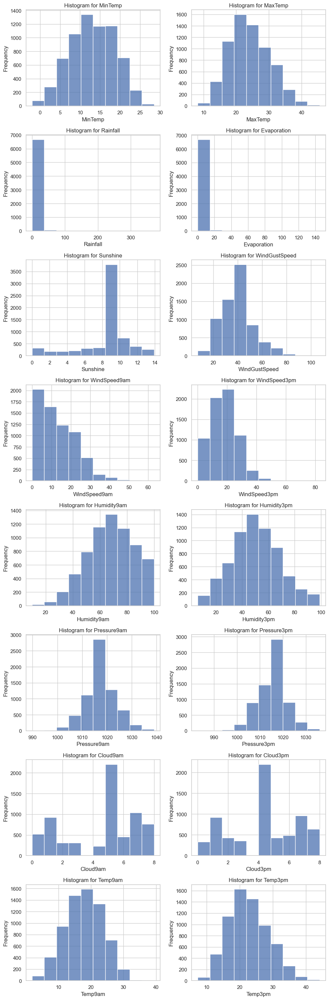

In [39]:
# Univariate analysis using histogram
columns_to_plot = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                   'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
rows = 8
columns = 2

plt.figure(figsize = (10, 30))

for i in range(0, len(columns_to_plot)):
    plt.subplot(rows, columns, i+1)
    sns.histplot(df[columns_to_plot[i]], bins = 10) 
    plt.title("Histogram for " + columns_to_plot[i])
    plt.ylabel("Frequency")
    plt.tight_layout()

plt.show()

### Observations:

#### MinTemp
Most of the days have a minimum temperature close to the mean, and extreme values are rare.

#### MaxTemp
Maximum temperatures are typically clustered around the mean, with only a few days experiencing exceptionally high or low temperatures.

#### Rainfall
The majority of days have little to no rainfall, but there are some days with high rainfall values, suggesting occasional heavy rainfall events.

#### Evaporation
Evaporation levels are generally consistent, with most days experiencing similar evaporation rates around the mean.

#### Sunshine
Sunshine hours are relatively stable, with most days having a consistent amount of sunshine close to the mean value.

#### WindGustSpeed
Lower wind gust speeds are more common, but occasional days experience high wind gusts, indicated by the right skew in the histogram.

#### WindSpeed9am
Calm mornings with low wind speeds are common, but there are days with higher wind speeds.

#### WindSpeed3pm
Afternoons typically have moderate wind speeds, but some days experience higher winds.

#### Humidity9am
Morning humidity levels vary, but the distribution is relatively symmetric, with a concentration around the mean.

#### Humidity3pm
Afternoon humidity levels vary widely, with some days having lower humidity values and others with higher humidity.

#### Pressure9am
Pressure at 9 am is generally stable, with most days clustered around the mean pressure value.

#### Pressure3pm
Pressure at 3 pm is also stable, with most days having values close to the mean pressure.

#### Cloud9am
Cloud cover at 9 am varies, but days with average cloudiness around the mode are common.

#### Cloud3pm
Cloud cover at 3 pm also varies, with days experiencing typical afternoon cloudiness around the mode.

#### Temp9am
Morning temperatures are relatively stable, with most days experiencing temperatures close to the mean.

#### Temp3pm
Afternoon temperatures vary, but many days have temperatures clustered around the mode, which is around 22.1.

### Violin Plot

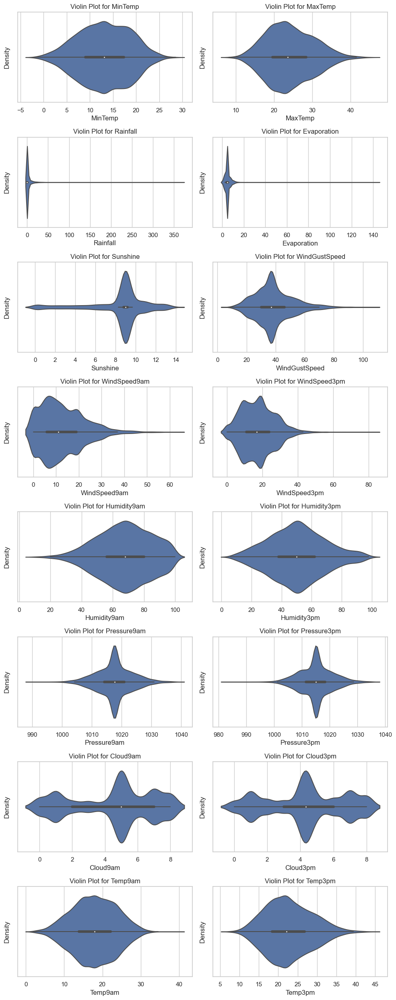

In [40]:
# Univariate analysis using violin plot 
columns_to_plot = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                   'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
rows = 8
columns = 2

plt.figure(figsize = (10, 25))

# Loop through the columns and create violin plots
for i in range(0, len(columns_to_plot)):
    plt.subplot(rows, columns, i + 1)
    sns.violinplot(x=df[columns_to_plot[i]])
    plt.title("Violin Plot for " + columns_to_plot[i])
    plt.xlabel(columns_to_plot[i])
    plt.ylabel("Density")
    plt.tight_layout()

plt.show()

### Observations:
#### MinTemp
Violin plot shows that the distribution of minimum temperatures is relatively normal, with a peak near the mean. Extreme values are rare, as indicated by the narrow tails.

#### MaxTemp
The violin plot suggests that maximum temperatures are clustered around the mean, with a few days experiencing exceptionally high or low temperatures, represented by the wide tails.

#### Rainfall 
Most days have little to no rainfall, as depicted by the narrow portion of the violin plot. However, there are occasional days with high rainfall values, represented by the extended tail.

#### Evaporation 
The violin plot illustrates that evaporation levels are generally consistent, with most days clustered around the mean. Extreme values are rare.

#### Sunshine 
Sunshine hours are relatively stable, with most days having a consistent amount of sunshine close to the mean value, as shown by the compact width of the plot.

#### WindGustSpeed 
Lower wind gust speeds are more common, as indicated by the wider section of the violin plot, but there are occasional days with high wind gusts, represented by the extended tail.

#### WindSpeed9am 
Calm mornings with low wind speeds are common, as suggested by the wider portion of the plot, but there are days with higher wind speeds, depicted by the extended tails.

#### WindSpeed3pm
Afternoons typically have moderate wind speeds, as shown by the broader part of the violin plot. Some days experience higher winds, represented by the extended tails.

#### Humidity9am 
The violin plot illustrates that morning humidity levels vary, but the distribution is relatively symmetric, with a concentration around the mean.

#### Humidity3pm 
Afternoon humidity levels vary widely, with some days having lower humidity values and others with higher humidity, as depicted by the extended tails of the plot.

#### Pressure9am 
Pressure at 9 am is generally stable, with most days clustered around the mean pressure value, as indicated by the compact width of the plot.

#### Pressure3pm 
Pressure at 3 pm is also stable, with most days having values close to the mean pressure, represented by the compact width of the plot.

#### Cloud9am 
The violin plot shows that cloud cover at 9 am varies, but days with average cloudiness around the mode are common, as indicated by the wider section of the plot.

#### Cloud3pm
Cloud cover at 3 pm also varies, with days experiencing typical afternoon cloudiness around the mode, represented by the wider portion of the plot.

#### Temp9am
Morning temperatures are relatively stable, with most days experiencing temperatures close to the mean, as shown by the compact width of the plot.

#### Temp3pm
Afternoon temperatures vary, but many days have temperatures clustered around the mode, which is around 22.1, as depicted by the wider section of the plot.

## Bivariate Analysis

### Count Plot

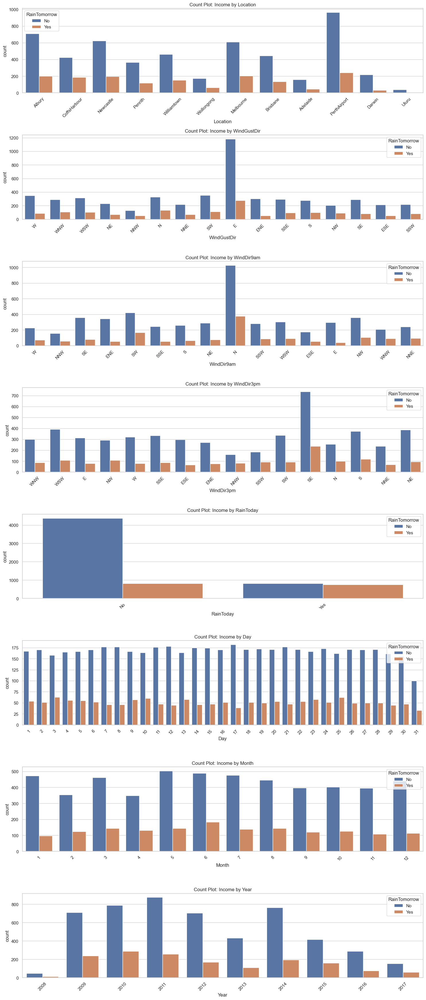

In [41]:
# Bivariate analysis using count plot
columns_to_plot = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'Day', 'Month', 'Year']

rows = 8
columns = 1 

plt.figure(figsize = (15, 35))

for i in range(0, len(columns_to_plot)):
    plt.subplot(rows, columns, i + 1)
    sns.countplot(x = columns_to_plot[i], hue = 'RainTomorrow', data = df)
    plt.title("Count Plot: Income by " + columns_to_plot[i])
    plt.xticks(rotation = 45)
    plt.tight_layout()

plt.show()

### Observations:
#### RainTomorrow by Location
Adelaide and Brisbane have a mix of the probability of rain and the probability of no rain, with a higher likelihood of no rain. CoffsHarbour has a higher probability of rain compared to Darwin, which has a lower probability of rain. Melbourne, Newcastle, and Penrith show a higher probability of no rain, but still, a significant likelihood of rain is observed. PerthAirport experiences both the probability of rain and the probability of no rain, with a higher likelihood of no rain. Uluru has a very low probability of rain. Williamtown indicates a higher likelihood of no rain, while Wollongong has a balanced distribution of the probability of rain and no rain.

#### RainTomorrow by WindGustDir
E, ENE, ESE, N, and NE display a mix of the probability of rain and the probability of no rain, with a higher likelihood of no rain. NNE, NNW, NW, S, and SE have a higher probability of rain. SSE, SSW, SW, W, WNW, and WSW show a balanced distribution of the probability of rain and no rain.

#### RainTomorrow by WindDir9am
E and ESE have a higher probability of no rain, while N has a higher probability of rain. NE, NNE, NNW, NW, S, SE, SSE, SSW, SW, W, and WNW have a balanced distribution of the probability of rain and no rain.

#### RainTomorrow by WindDir3pm
E and ESE have a higher probability of no rain, while N has a higher probability of rain. NE, NNE, NNW, NW, S, SE, SSE, SSW, SW, W, and WNW display a balanced distribution of the probability of rain and no rain.

#### RainTomorrow by RainToday
When it's 'No' for rain today, there's a higher probability of no rain tomorrow, but there are still a significant number of cases where it rains tomorrow. When it's 'Yes' for rain today, there's a higher probability of rain tomorrow, indicating some level of predictability.

#### RainTomorrow by Day
There's no clear pattern between the day of the month and the probability of rain tomorrow.

#### RainTomorrow by Month
No particular month stands out as having a significantly higher chance of the probability of rain tomorrow, indicating a relatively balanced distribution.

#### RainTomorrow by Year
Different years show varied patterns, with some years having a higher probability of rain than others. However, no specific trend stands out.

### Pair Plot

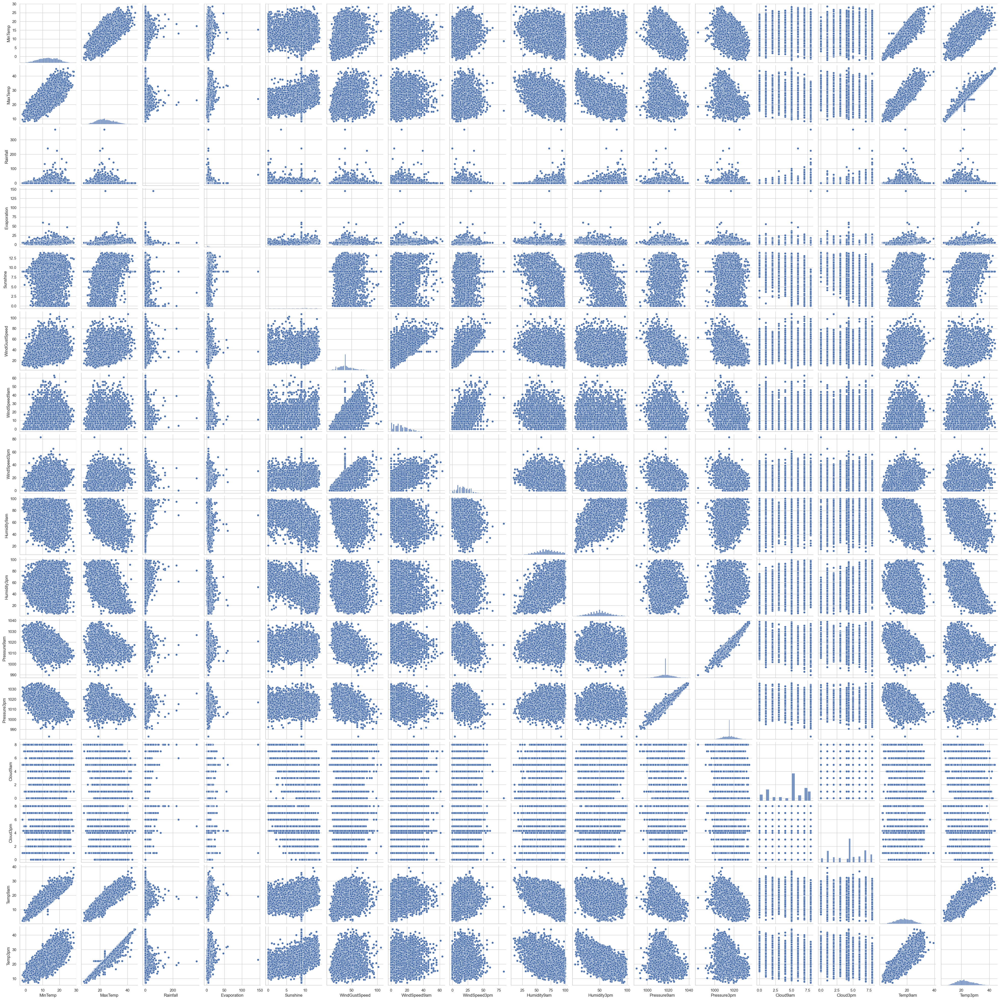

In [42]:
# Bivariate analysis using pairplot
columns_to_plot = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                   'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

sns.pairplot(df[columns_to_plot])
plt.show()

### Observations:
The pair plot reveals good relationship between temperature attributes, wind speeds, atmospheric pressure, and humidity levels, regardless of the time of day. Cloud cover patterns also persist throughout the day, with a good relationship between morning and afternoon cloud cover. Additionally, temperature is strogly associated to humidity, and higher temperatures are associated with lower rainfall, irrespective of the time of day.

### Line Plot

Text(0.5, 1.0, 'Line Plot: Month vs Rainfall')

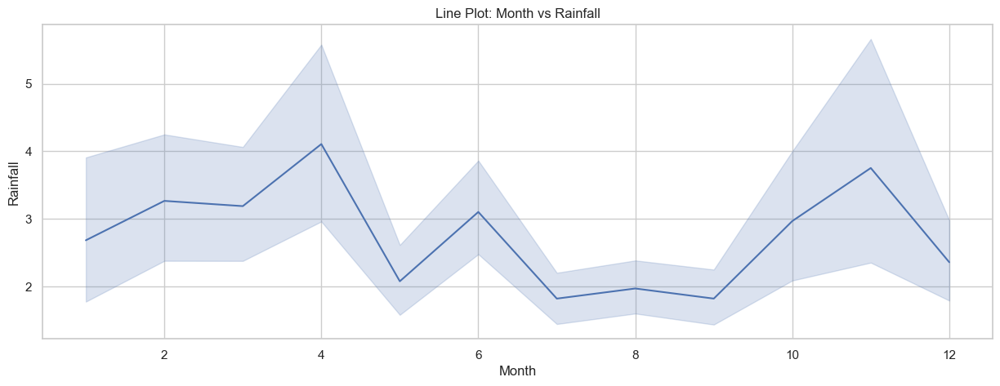

In [43]:
# Bivariate analysis using line plot
plt.figure(figsize = (15, 5))
sns.lineplot(data = df, x = 'Month', y = 'Rainfall')
plt.title("Line Plot: Month vs Rainfall")

### Observations:
#### Month vs Rainfall
The line plot illustrates the monthly variations in rainfall. It shows that certain months, such as February, March, April, and November, experience higher rainfall, suggesting potential wet seasons. Conversely, July, August, and September are drier months. The plot highlights seasonal patterns and fluctuations in rainfall levels throughout the year.

Text(0.5, 1.0, 'Line Plot: Year vs Rainfall')

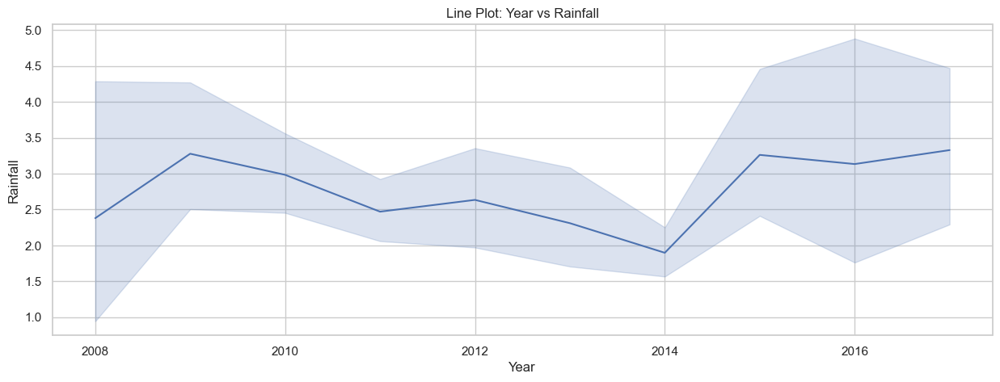

In [44]:
# Bivariate analysis using line plot
plt.figure(figsize = (15, 5))
sns.lineplot(data = df, x = 'Year', y = 'Rainfall')
plt.title("Line Plot: Year vs Rainfall")

### Observations:
#### Year vs Rainfall
The line plot for annual rainfall demonstrates notable fluctuations in rainfall levels over the years. The data shows that 2017 had the highest annual rainfall, followed by 2009 and 2015. In contrast, 2014 had the lowest recorded annual rainfall. These variations could indicate changing weather patterns and climate conditions over the years.

## Multivariate Analysis

### Scatter Plot

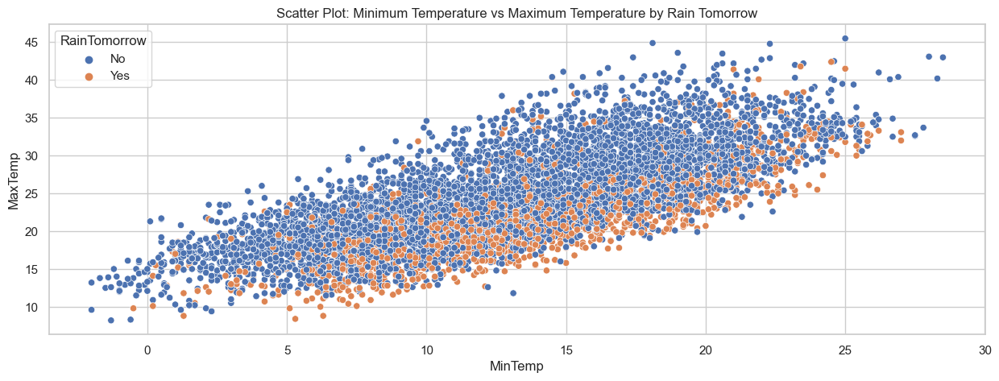

In [45]:
plt.figure(figsize = (15, 5))
sns.scatterplot(x = 'MinTemp', y = 'MaxTemp', hue = 'RainTomorrow', data = df)
plt.title("Scatter Plot: Minimum Temperature vs Maximum Temperature by Rain Tomorrow")
plt.show()

### Observations:
#### Minimum Temperature vs Maximum Temperature by Rain Tomorrow
The scatter plot comparing 'Minimum Temperature' to 'Maximum Temperature', categorized by 'RainTomorrow' (Yes or No), indicates that The majority of data points are concentrated in the 'No' (no rain) category and 'Yes' (rain) category has substantially fewer data points.

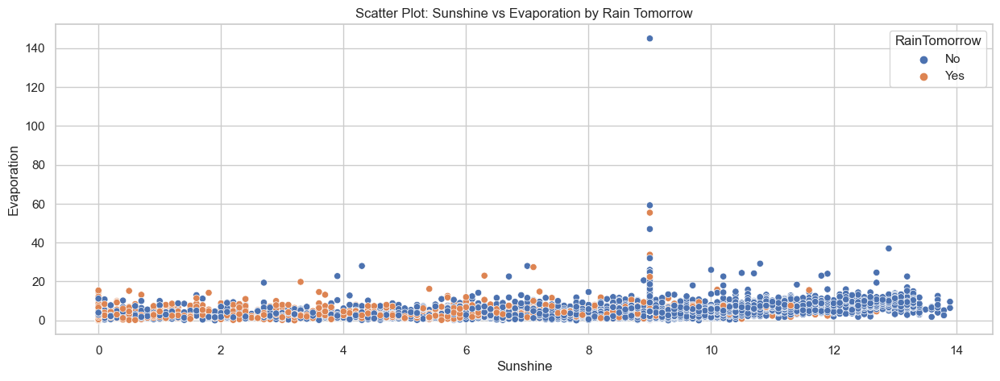

In [46]:
plt.figure(figsize = (15, 5))
sns.scatterplot(x = 'Sunshine', y = 'Evaporation', hue = 'RainTomorrow', data = df)
plt.title("Scatter Plot: Sunshine vs Evaporation by Rain Tomorrow")
plt.show()

### Observations:
#### Sunshine vs Evaporation by Rain Tomorrow
The scatter plot comparing 'Sunshine' to 'Evaporation', categorized by 'RainTomorrow' (Yes or No), indicates that The majority of data points are concentrated in the 'No' (no rain) category and 'Yes' (rain) category has substantially fewer data points.

# Label Encoding

Converting the categorical columns into numerical columns.

In [47]:
# List of categorical columns
categorical_columns = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
encoder = LabelEncoder()
for i in categorical_columns:
    df[i] = encoder.fit_transform(df[i])

In [48]:
# Display dataset after updation
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,0.6,4.6,9.0,13,44.0,13,14,...,1007.1,8.0,4.320988,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,4.6,9.0,14,44.0,6,15,...,1007.8,5.0,4.320988,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,4.6,9.0,15,46.0,13,15,...,1008.7,5.0,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,4.6,9.0,4,24.0,9,0,...,1012.8,5.0,4.320988,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,4.6,9.0,13,41.0,1,7,...,1006.0,7.0,8.000000,17.8,29.7,0,0,2008,12,5


## Storing this dataset separately for building 'Whether or Not It Will Rain Tomorrow' prediction model and  'How Much Rainfall Could Be There' prediction model.

In [49]:
# For predicting 'Whether or Not It Will Rain Tomorrow'
df_c = df.copy()

# For predicting 'How Much Rainfall Could Be There'
df_r = df.copy()

# Building 'Whether or Not It Will Rain Tomorrow' prediction model

##  Features and the Target Variable for Predicting 'Whether or Not It Will Rain Tomorrow':

### Features: 
Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, Year, Month, Day

### Target variable:
RainTomorrow

In [50]:
# Display the dataset
df_c.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,0.6,4.6,9.0,13,44.0,13,14,...,1007.1,8.0,4.320988,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,4.6,9.0,14,44.0,6,15,...,1007.8,5.0,4.320988,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,4.6,9.0,15,46.0,13,15,...,1008.7,5.0,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,4.6,9.0,4,24.0,9,0,...,1012.8,5.0,4.320988,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,4.6,9.0,13,41.0,1,7,...,1006.0,7.0,8.000000,17.8,29.7,0,0,2008,12,5


## Checking for the outliers 

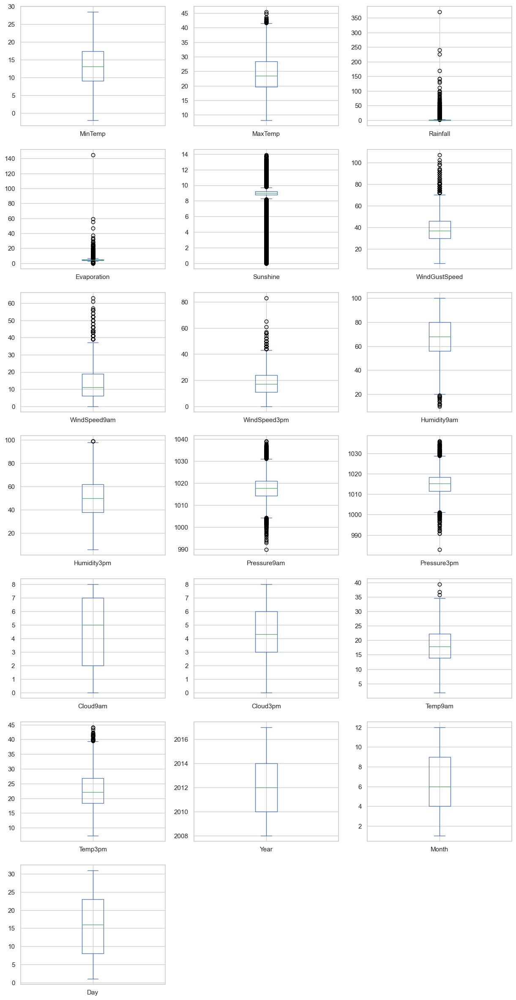

In [51]:
# Checking for the outliers using box plot

# List of numerical columns
numerical_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                     'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm',
                     'Year', 'Month', 'Day']

df_c[numerical_columns].plot(kind = 'box', subplots = True, figsize = (15, 30), layout = (7, 3))
plt.show()

### Observations:
Outliers are present in 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', and 'Temp3pm'  columns.

In [52]:
# List of columns containing
columns_with_outliers = ['MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 
                         'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm' ]

In [53]:
# Checking for the outliers using Z-Score
z_score = abs(zscore(df_c[columns_with_outliers]))
z_score

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,0.194668,0.202435,0.11869,0.207361,0.395568,0.739082,0.674191,0.203097,1.539016,1.646846,1.344002,0.173897,0.150755
1,0.164227,0.259635,0.11869,0.207361,0.395568,0.895514,0.464727,1.368362,1.376828,1.165715,1.226694,0.121468,0.267878
2,0.262108,0.259635,0.11869,0.207361,0.544900,0.636920,0.883655,1.717576,1.106513,1.663437,1.075869,0.542637,0.083680
3,0.637317,0.259635,0.11869,0.207361,1.097751,0.180378,0.896789,1.310160,1.863394,0.004365,0.388779,0.035820,0.636275
4,1.338795,0.164301,0.11869,0.207361,0.171570,0.589027,0.255263,0.843321,0.944325,1.132534,1.528343,0.016609,1.172125
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,0.113101,0.259635,0.11869,0.207361,0.575089,0.023947,0.687325,0.960947,1.430891,1.156985,0.868092,1.362295,0.050283
8421,0.196854,0.259635,0.11869,0.207361,1.247082,0.023947,0.896789,0.669936,1.593079,0.974487,0.666993,1.222484,0.301369
8422,0.457869,0.259635,0.11869,0.207361,0.127093,0.384702,0.896789,0.844543,1.430891,0.559719,0.281552,0.942861,0.569294
8423,0.474183,0.259635,0.11869,0.207361,0.799087,0.023947,1.106253,0.960947,1.430891,0.294268,0.231277,0.488473,0.552548


In [54]:
# Identify the indices where the z-score is greater than 3
np.where(z_score > 3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
         568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
         770,  795,  796,  797,  802,  928,  928,  928,  935,  941,  949,
         978,  979,  979,  980,  980,  980,  980,  981, 1007, 1008, 1008,
        1009, 1010, 1011, 1115, 1138, 1138, 1148, 1148, 1149, 1150, 1151,
        1189, 1202, 1202, 1203, 1237, 1241, 1264, 1264, 1265, 1265, 1356,
        1357, 1386, 1411, 1412, 1413, 1465, 1466, 1479, 1479, 1480, 1480,
        1481, 1486, 1513, 1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680,
        1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2043, 2074, 2108,
        2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265, 2429, 2488, 2500,
        2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735, 2827, 2835, 2837,
        2849, 2849, 2855, 2859, 2863, 

In [55]:
# Removing Outliers
z = 3
updated_df_c = df_c[(z_score < z).all(axis = 1)]
updated_df_c

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,0.6,4.6,9.0,13,44.0,13,14,...,1007.1,8.0,4.320988,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,4.6,9.0,14,44.0,6,15,...,1007.8,5.0,4.320988,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,4.6,9.0,15,46.0,13,15,...,1008.7,5.0,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,4.6,9.0,4,24.0,9,0,...,1012.8,5.0,4.320988,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,4.6,9.0,13,41.0,1,7,...,1006.0,7.0,8.000000,17.8,29.7,0,0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.4,0.0,4.6,9.0,0,31.0,9,1,...,1020.3,5.0,4.320988,10.1,22.4,0,0,2017,6,21
8421,9,3.6,25.3,0.0,4.6,9.0,6,22.0,9,3,...,1019.1,5.0,4.320988,10.9,24.5,0,0,2017,6,22
8422,9,5.4,26.9,0.0,4.6,9.0,3,37.0,9,14,...,1016.8,5.0,4.320988,12.5,26.1,0,0,2017,6,23
8423,9,7.8,27.0,0.0,4.6,9.0,9,28.0,10,3,...,1016.5,3.0,2.000000,15.1,26.0,0,0,2017,6,24


In [56]:
# Checking the shape of dataframe after removing the outliers
updated_df_c.shape

(6305, 25)

## Checking for the skewness

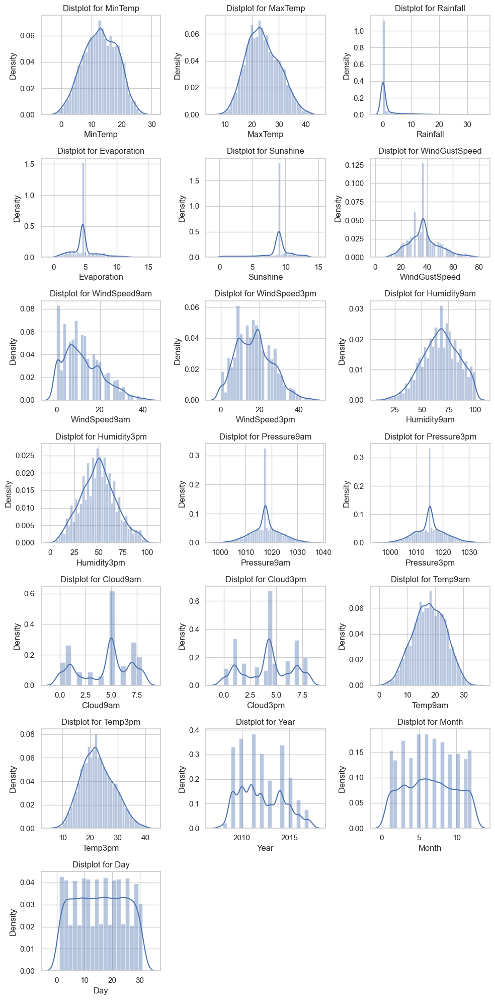

In [57]:
# Checking for the skewness using Dist plot 
ncol = 3
nrow = 7
plt.figure(figsize = (10, 20))

for i in range(0, len(numerical_columns)):
    plt.subplot(nrow, ncol, i+1)
    sns.distplot(updated_df_c[numerical_columns[i]]) 
    plt.title("Distplot for " + numerical_columns[i]) 
    plt.tight_layout()

plt.show()

### Observations:

'MinTemp' shows a relatively symmetric distribution with no significant skewness.

'MaxTemp' shows a right-skewed distribution.

'Rainfall' suggests a highly right-skewed distribution.

'Evaporation' appears to have a right-skewed distribution.

'Sunshine' displays a left-skewed distribution.

'WindGustSpeed' exhibits a right-skewed distribution.

'WindSpeed9am' suggests a right-skewed distribution.

'WindSpeed3pm' also appears to have a right-skewed distribution.

'Humidity9am' shows a left-skewed distribution.

'Humidity3pm' suggests a right-skewed distribution.

'Pressure9am' shows a relatively symmetric distribution with no significant skewness.

'Pressure3pm' shows a relatively symmetric distribution with no significant skewness.

'Cloud9am' appears to have a left-skewed distribution.

'Cloud3pm' also shows a left-skewed distribution.

'Temp9am' shows a relatively symmetric distribution with no significant skewness.

'Temp3pm' displays a right-skewed distribution.

'Year' appears to have a right-skewed distribution.

'Month' shows a relatively symmetric distribution with no significant skewness.

'Day' exhibits a relatively symmetric distribution with no significant skewness.

In [58]:
# Checking for the skewness using skew() method
updated_df_c[numerical_columns].skew()

MinTemp         -0.073120
MaxTemp          0.263690
Rainfall         3.572436
Evaporation      1.136753
Sunshine        -1.358828
WindGustSpeed    0.544830
WindSpeed9am     0.680216
WindSpeed3pm     0.342765
Humidity9am     -0.224837
Humidity3pm      0.138110
Pressure9am      0.064634
Pressure3pm      0.086202
Cloud9am        -0.400423
Cloud3pm        -0.138218
Temp9am         -0.074991
Temp3pm          0.288331
Year             0.338266
Month            0.030646
Day              0.005324
dtype: float64

Skewness is present in 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', and 'WindSpeed9am' columns.

In [59]:
# List of the columns to be transformed
columns_to_transform = ['Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am']

# Copying data
updated_df_c2 = updated_df_c.copy()

# Reduing skewnees using yeojohnson Transformation
for column in columns_to_transform: 
    transformed_data, lambda_value = yeojohnson(updated_df_c[column] + 1)
    updated_df_c2[column] = transformed_data

In [60]:
updated_df_c2[columns_to_transform].skew()

Rainfall         1.166684
Evaporation      0.029102
Sunshine        -0.041633
WindGustSpeed    0.008020
WindSpeed9am    -0.092898
dtype: float64

Skewness in every column has been reduced, indicating a more balanced and symmetric distribution of data in each column.

In [61]:
# Display the updated dataset
updated_df_c2.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,0.352470,2.381807,92.771754,13,10.381966,13,14,...,1007.1,8.0,4.320988,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.321120,2.381807,92.771754,14,10.381966,6,15,...,1007.8,5.0,4.320988,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.321120,2.381807,92.771754,15,10.628524,13,15,...,1008.7,5.0,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.321120,2.381807,92.771754,4,7.500038,9,0,...,1012.8,5.0,4.320988,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,0.362426,2.381807,92.771754,13,10.000936,1,7,...,1006.0,7.0,8.000000,17.8,29.7,0,0,2008,12,5


## Correlation Coefficient Matrix

In [62]:
# Checking the correalation coefficient matrix
correlation_coefficient = updated_df_c2.corr()
correlation_coefficient

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,0.095962,0.072443,0.009798,0.107965,0.064150,-0.086156,0.276428,-0.100510,0.002253,...,-0.016923,-0.008862,0.001074,0.100740,0.068299,0.002484,0.007519,0.504933,-0.072855,-0.003702
MinTemp,0.095962,1.000000,0.737747,0.064681,0.390616,0.080959,-0.142956,0.267862,-0.019958,-0.142854,...,-0.446986,0.064543,0.035630,0.894317,0.707420,0.062954,0.081732,0.035196,-0.234002,0.017066
MaxTemp,0.072443,0.737747,1.000000,-0.244699,0.485424,0.363093,-0.200268,0.186412,-0.192361,-0.166038,...,-0.426335,-0.236135,-0.231048,0.867117,0.975030,-0.219639,-0.154579,0.077777,-0.172085,0.018575
Rainfall,0.009798,0.064681,-0.244699,1.000000,-0.207537,-0.252372,0.115810,0.078547,0.152982,0.118644,...,-0.028802,0.289816,0.262739,-0.107992,-0.255564,0.944031,0.316399,0.011688,-0.004260,-0.009547
Evaporation,0.107965,0.390616,0.485424,-0.207537,1.000000,0.470678,-0.121106,0.211363,-0.113547,-0.027860,...,-0.308127,-0.123891,-0.165681,0.456325,0.472911,-0.184555,-0.104647,0.089044,-0.045769,0.006242
Sunshine,0.064150,0.080959,0.363093,-0.252372,0.470678,1.000000,-0.117885,0.051098,-0.108829,-0.056157,...,-0.111867,-0.501698,-0.533924,0.261083,0.382069,-0.222210,-0.298953,0.066163,-0.003834,-0.000127
WindGustDir,-0.086156,-0.142956,-0.200268,0.115810,-0.121106,-0.117885,1.000000,0.017114,0.379358,0.454594,...,-0.010787,0.130933,0.072212,-0.157290,-0.210470,0.113372,0.035527,-0.184194,0.032727,0.017805
WindGustSpeed,0.276428,0.267862,0.186412,0.078547,0.211363,0.051098,0.017114,1.000000,-0.054669,0.102819,...,-0.324861,-0.014256,0.039484,0.249795,0.154238,0.082653,0.163451,-0.021755,0.048782,-0.003309
WindDir9am,-0.100510,-0.019958,-0.192361,0.152982,-0.113547,-0.108829,0.379358,-0.054669,1.000000,0.202162,...,0.051324,0.068703,0.052673,-0.065530,-0.201210,0.151341,0.034833,-0.081273,0.019081,-0.004047
WindDir3pm,0.002253,-0.142854,-0.166038,0.118644,-0.027860,-0.056157,0.454594,0.102819,0.202162,1.000000,...,-0.045147,0.078159,0.053453,-0.149872,-0.177815,0.101941,0.002626,0.007258,0.029038,0.002267


Let's use the heatmap to visualize and interpret the correlation coefficient matrix.

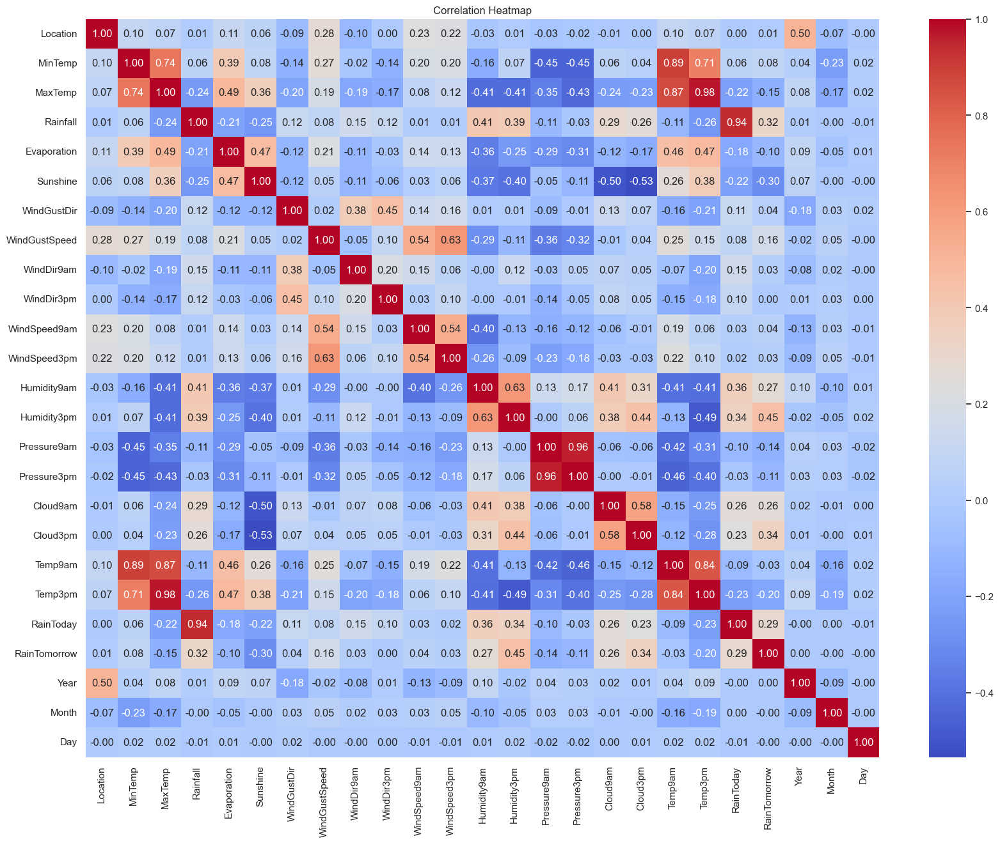

In [63]:
# Plotting the heatmap for correlation coefficient matrix
plt.figure(figsize = (20, 15))
sns.heatmap(correlation_coefficient, annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.title("Correlation Heatmap")
plt.show()

### Observations:
Location: This column represents the location of the data points. It has a strong positive correlation with the 'Year' variable, indicating that locations may vary over the years. It also has a weak negative correlation with 'Sunshine'. The correlation with other numerical variables is minimal. The location is not strongly correlated with most other features.

MinTemp: It shows a strong positive correlation with 'MaxTemp', 'Temp9am', and 'Temp3pm', indicating that as the minimum temperature increases, these other temperature-related variables also tend to increase. It has a negative correlation with 'Humidity9am' and 'Humidity3pm', suggesting that as the minimum temperature increases, humidity tends to decrease.

MaxTemp: It has a strong positive correlation with 'MinTemp', 'Temp9am', and 'Temp3pm', indicating that higher maximum temperatures are associated with higher values of these variables. It also has a negative correlation with 'Rainfall' and 'Humidity3pm', implying that higher maximum temperatures are associated with lower rainfall and lower afternoon humidity.

Rainfall: This variable shows a positive correlation with 'WindGustSpeed' and 'WindSpeed3pm', indicating that more rainfall is associated with higher wind speeds. It has a strong negative correlation with 'Sunshine', 'Evaporation', and 'Cloud3pm', suggesting that higher rainfall is associated with less sunshine, lower evaporation, and cloudier afternoons.

Evaporation: It has a positive correlation with 'MaxTemp', 'Temp9am', and 'Temp3pm', indicating that higher evaporation is associated with higher temperatures. It has a negative correlation with 'Humidity9am' and 'Humidity3pm', suggesting that higher evaporation is associated with lower morning and afternoon humidity.

Sunshine: This variable shows a positive correlation with 'MaxTemp', 'Temp9am', and 'Temp3pm', indicating that more sunshine is associated with higher temperatures. It has a negative correlation with 'Rainfall' and 'Cloud3pm', suggesting that more sunshine is associated with less rainfall and fewer clouds in the afternoon.

WindGustDir: It is a categorical variable representing the direction of the wind gust. Its correlations with numerical variables are weak and don't provide strong insights.

WindGustSpeed: It has a positive correlation with 'Location' and 'Year', suggesting that wind gust speed might vary with location and year, but the correlations are not very strong.

WindDir9am and WindDir3pm: These variables represent wind directions. Their correlations with numerical variables are weak and don't provide strong insights.

WindSpeed9am and WindSpeed3pm: These variables show a positive correlation with 'WindGustSpeed', indicating that higher wind speeds in the morning and afternoon tend to be associated with higher wind gust speeds.

Humidity9am and Humidity3pm: These variables have a negative correlation with temperature-related variables, such as 'MaxTemp', 'Temp9am', and 'Temp3pm', indicating that as temperature increases, humidity tends to decrease.

Pressure9am and Pressure3pm: These variables have a negative correlation with 'Location', indicating that pressure might vary with location. They also have positive correlations with 'Year', suggesting that pressure values might change over time.

Cloud9am and Cloud3pm: These variables show negative correlations with sunshine-related variables and positive correlations with humidity-related variables, which is expected.

Temp9am and Temp3pm: These temperature-related variables show strong positive correlations with each other and with 'MaxTemp', indicating that they are highly related to each other and to maximum temperature.

RainToday and RainTomorrow: These binary variables indicate whether it rained today and whether it will rain tomorrow. They are expected to have a positive correlation, but the correlation is weak.

Year, Month, and Day: These time-related variables show correlations with some weather-related variables, suggesting that weather conditions may change over time, but the correlations are not very strong.

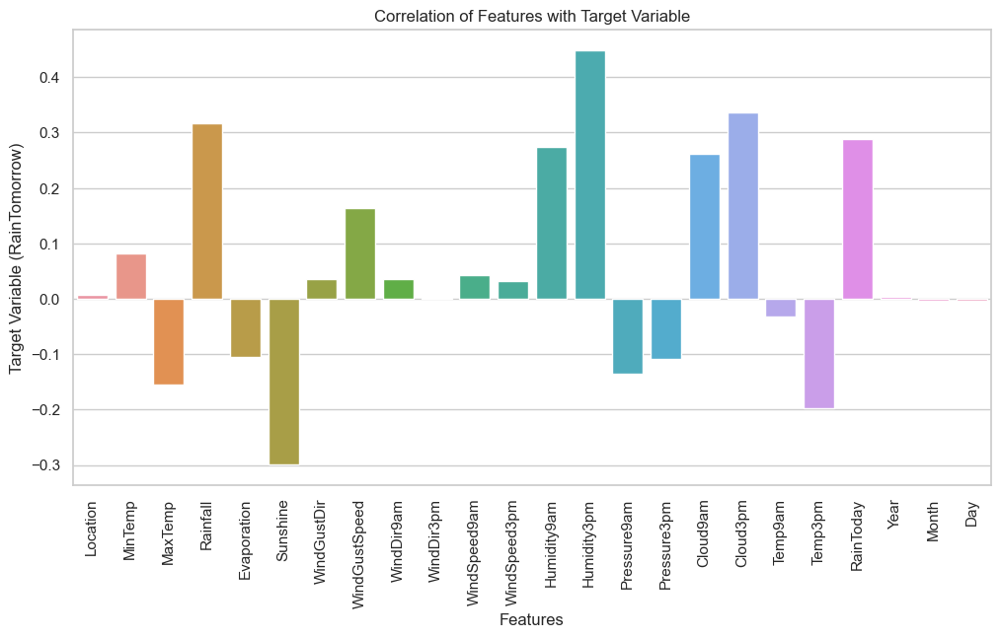

In [64]:
# Checking for the correlation between features and target variable separately
target = 'RainTomorrow'

correlation_matrix = updated_df_c2.corr()
correlations_with_target = correlation_matrix[target].drop(target)

plt.figure(figsize=(12, 6))
sns.barplot(x = correlations_with_target.index, y = correlations_with_target.values)
plt.xlabel('Features')
plt.ylabel('Target Variable (RainTomorrow)')
plt.title('Correlation of Features with Target Variable')
plt.xticks(rotation = 90)

plt.show()

### Observations:

Location: 'RainTomorrow' has a very weak positive correlation (0.007519) with 'Location'. This suggests that the specific location doesn't strongly influence the likelihood of rain tomorrow.

MinTemp: 'RainTomorrow' has a weak positive correlation (0.081732) with 'MinTemp'. This implies that slightly higher minimum temperatures are associated with a slightly higher likelihood of rain the next day.

MaxTemp: 'RainTomorrow' has a weak negative correlation (-0.154579) with 'MaxTemp'. This suggests that higher maximum temperatures are associated with a slightly lower likelihood of rain the following day.

Rainfall: 'RainTomorrow' has a weak positive correlation (0.316399) with 'Rainfall'. This indicates that higher levels of rainfall on the current day are associated with a higher likelihood of rain the next day.

Evaporation: 'RainTomorrow' has a weak negative correlation (-0.104647) with 'Evaporation'. This implies that higher evaporation rates are associated with a slightly lower likelihood of rain the following day.

Sunshine: 'RainTomorrow' has a weak negative correlation (-0.298953) with 'Sunshine'. This suggests that more sunshine on the current day is associated with a slightly lower likelihood of rain the next day.

WindGustDir: 'RainTomorrow' has a very weak positive correlation (0.035527) with 'WindGustDir'. This suggests that the specific direction of the wind gust doesn't strongly influence the likelihood of rain tomorrow.

WindGustSpeed: 'RainTomorrow' has a weak positive correlation (0.163451) with 'WindGustSpeed'. This indicates that higher wind gust speeds on the current day are associated with a slightly higher likelihood of rain the following day.

WindDir9am: 'RainTomorrow' has a weak negative correlation (-0.004047) with 'WindDir9am'. This implies that the specific direction of the wind at 9 am doesn't strongly influence the likelihood of rain tomorrow.

WindDir3pm: 'RainTomorrow' has a very weak negative correlation (-0.000224) with 'WindDir3pm'. This suggests that the specific direction of the wind at 3 pm doesn't strongly influence the likelihood of rain tomorrow.

WindSpeed9am: 'RainTomorrow' has a weak positive correlation (0.002626) with 'WindSpeed9am'. This indicates that higher wind speeds at 9 am are associated with a slightly higher likelihood of rain the next day.

WindSpeed3pm: 'RainTomorrow' has a weak positive correlation (0.042456) with 'WindSpeed3pm'. This implies that higher wind speeds at 3 pm are associated with a slightly higher likelihood of rain the following day.

Humidity9am: 'RainTomorrow' has a very weak negative correlation (-0.009607) with 'Humidity9am'. This suggests that the humidity at 9 am doesn't strongly influence the likelihood of rain tomorrow.

Humidity3pm: 'RainTomorrow' has a very weak negative correlation (-0.004690) with 'Humidity3pm'. This indicates that the humidity at 3 pm doesn't strongly influence the likelihood of rain tomorrow.

Pressure9am: 'RainTomorrow' has a very weak negative correlation (-0.091016) with 'Pressure9am'. This implies that the atmospheric pressure at 9 am doesn't strongly influence the likelihood of rain tomorrow.

Pressure3pm: 'RainTomorrow' has a very weak negative correlation (-0.003538) with 'Pressure3pm'. This suggests that the atmospheric pressure at 3 pm doesn't strongly influence the likelihood of rain tomorrow.

Cloud9am: 'RainTomorrow' has a very weak positive correlation (0.026558) with 'Cloud9am'. This indicates that cloudiness at 9 am doesn't strongly influence the likelihood of rain tomorrow.

Cloud3pm: 'RainTomorrow' has a very weak positive correlation (0.029385) with 'Cloud3pm'. This suggests that cloudiness at 3 pm doesn't strongly influence the likelihood of rain tomorrow.

Temp9am: 'RainTomorrow' has a very weak positive correlation (0.044984) with 'Temp9am'. This implies that the temperature at 9 am doesn't strongly influence the likelihood of rain tomorrow.

Temp3pm: 'RainTomorrow' has a weak negative correlation (-0.201905) with 'Temp3pm'. This indicates that higher temperatures at 3 pm are associated with a slightly lower likelihood of rain the following day.

RainToday: 'RainTomorrow' has a weak positive correlation (0.303565) with 'RainToday'. This suggests that the presence of rain on the current day is associated with a higher likelihood of rain the following day.

Year: 'RainTomorrow' has a very weak positive correlation (0.000418) with 'Year'. This implies that the specific year doesn't strongly influence the likelihood of rain tomorrow.

Month: 'RainTomorrow' has a very weak negative correlation (-0.003259) with 'Month'. This suggests that the specific month doesn't strongly influence the likelihood of rain tomorrow.

Day: 'RainTomorrow' has a very weak negative correlation (-0.001717) with 'Day'. This indicates that the specific day of the month doesn't strongly influence the likelihood of rain tomorrow.

## Feature Engineering

### Feature Scaling

In [65]:
# Extracting features and target from the dataset
features = updated_df_c2.drop(columns = 'RainTomorrow')
target = updated_df_c2['RainTomorrow']

In [66]:
# Performing standard scaling on the features
scaler = StandardScaler()
scaled_df = scaler.fit_transform(features)

In [67]:
# Creating a DataFrame 'updated_features' to store the scaled data using 'scaled_df'
updated_features = pd.DataFrame(scaled_df, columns = features.columns[:])
updated_features.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
0,-1.39082,0.077136,-0.200778,0.666080,0.014553,0.018782,1.224412,0.568574,1.321318,1.371163,...,-1.768165,-1.441508,1.434875,0.038815,-0.163129,-0.159443,-0.526886,-1.771042,1.653994,-1.671897
1,-1.39082,-1.005312,0.164759,-0.623775,0.014553,0.018782,1.415150,0.568574,-0.221198,1.594258,...,-1.259404,-1.317652,0.226798,0.038815,-0.110493,0.267119,-0.526886,-1.771042,1.653994,-1.558125
2,-1.39082,-0.013068,0.264451,-0.623775,0.014553,0.018782,1.605888,0.717853,1.321318,1.594258,...,-1.785708,-1.158408,0.226798,-0.969817,0.556227,0.079432,-0.526886,-1.771042,1.653994,-1.444353
3,-1.39082,-0.680577,0.646603,-0.623775,0.014553,0.018782,-0.492227,-1.176296,0.439880,-1.752177,...,-0.031361,-0.432963,0.226798,0.038815,0.047414,0.642493,-0.526886,-1.771042,1.653994,-1.330582
4,-1.39082,0.816808,1.361061,1.075724,0.014553,0.018782,1.224412,0.337879,-1.322996,-0.190507,...,-1.224317,-1.636140,1.032183,1.637603,-0.005222,1.188493,-0.526886,-1.771042,1.653994,-1.216810


## Checking for the Variance Inflation Factor

In [68]:
# Calculate VIF for each column
vif_data = pd.DataFrame()
vif_data["Features"] = updated_features.columns
vif_data["VIF"] = [variance_inflation_factor(updated_features.values, i) for i in range(updated_features.shape[1])]

# Print the VIF data
print(vif_data)

         Features        VIF
0        Location   1.651037
1         MinTemp   9.247851
2         MaxTemp  26.464450
3        Rainfall  10.110534
4     Evaporation   1.747471
5        Sunshine   2.036391
6     WindGustDir   1.584047
7   WindGustSpeed   2.258141
8      WindDir9am   1.346565
9      WindDir3pm   1.428175
10   WindSpeed9am   2.040076
11   WindSpeed3pm   1.972848
12    Humidity9am   4.164420
13    Humidity3pm   5.300527
14    Pressure9am  20.159338
15    Pressure3pm  19.414426
16       Cloud9am   1.921055
17       Cloud3pm   1.866576
18        Temp9am  17.853185
19        Temp3pm  32.993735
20      RainToday   9.339360
21           Year   1.571847
22          Month   1.145478
23            Day   1.004619


'Temp3pm' feature has highest VIF value let's drop it and again calculate the VIF values.

In [69]:
# Dropping 'Temp3pm' feature
updated_features.drop('Temp3pm', inplace = True, axis = 1)

In [70]:
# Calculate VIF for each column again
vif_data = pd.DataFrame()
vif_data["Features"] = updated_features.columns
vif_data["VIF"] = [variance_inflation_factor(updated_features.values, i) for i in range(updated_features.shape[1])]

# Print the VIF data
print(vif_data)

         Features        VIF
0        Location   1.650910
1         MinTemp   9.199870
2         MaxTemp   9.617402
3        Rainfall  10.110283
4     Evaporation   1.747444
5        Sunshine   2.033955
6     WindGustDir   1.580329
7   WindGustSpeed   2.251543
8      WindDir9am   1.345153
9      WindDir3pm   1.427438
10   WindSpeed9am   2.039482
11   WindSpeed3pm   1.967205
12    Humidity9am   3.717835
13    Humidity3pm   3.624830
14    Pressure9am  19.732769
15    Pressure3pm  19.050355
16       Cloud9am   1.918203
17       Cloud3pm   1.856963
18        Temp9am  16.564349
19      RainToday   9.339157
20           Year   1.571847
21          Month   1.130281
22            Day   1.004157


'Pressure9am' feature has highest VIF value let's drop it and again calculate the VIF values.

In [71]:
# Dropping 'Pressure9am' feature
updated_features.drop('Pressure9am', inplace = True, axis = 1)

In [72]:
# Calculate VIF for each column again
vif_data = pd.DataFrame()
vif_data["Features"] = updated_features.columns
vif_data["VIF"] = [variance_inflation_factor(updated_features.values, i) for i in range(updated_features.shape[1])]

# Print the VIF data
print(vif_data)

         Features        VIF
0        Location   1.648586
1         MinTemp   9.105234
2         MaxTemp   9.281188
3        Rainfall  10.085036
4     Evaporation   1.732683
5        Sunshine   2.025855
6     WindGustDir   1.568482
7   WindGustSpeed   2.234904
8      WindDir9am   1.320303
9      WindDir3pm   1.353603
10   WindSpeed9am   2.033562
11   WindSpeed3pm   1.957252
12    Humidity9am   3.717653
13    Humidity3pm   3.623332
14    Pressure3pm   1.442587
15       Cloud9am   1.918103
16       Cloud3pm   1.855414
17        Temp9am  16.521381
18      RainToday   9.338889
19           Year   1.570936
20          Month   1.129142
21            Day   1.003198


'Temp9am' feature has highest VIF value let's drop it and again calculate the VIF values.

In [73]:
# Dropping 'Temp9am' feature
updated_features.drop('Temp9am', inplace = True, axis = 1)

In [74]:
# Calculate VIF for each column again
vif_data = pd.DataFrame()
vif_data["Features"] = updated_features.columns
vif_data["VIF"] = [variance_inflation_factor(updated_features.values, i) for i in range(updated_features.shape[1])]

# Print the VIF data
print(vif_data)

         Features        VIF
0        Location   1.645485
1         MinTemp   4.813528
2         MaxTemp   5.601522
3        Rainfall  10.077812
4     Evaporation   1.725824
5        Sunshine   2.017748
6     WindGustDir   1.565781
7   WindGustSpeed   2.196618
8      WindDir9am   1.319281
9      WindDir3pm   1.353464
10   WindSpeed9am   2.011828
11   WindSpeed3pm   1.907337
12    Humidity9am   2.622485
13    Humidity3pm   2.866755
14    Pressure3pm   1.440479
15       Cloud9am   1.884476
16       Cloud3pm   1.853231
17      RainToday   9.338385
18           Year   1.565878
19          Month   1.114907
20            Day   1.003106


Now, the VIF values for all the features fall within a certain range.

In [75]:
# Storing the features and target variables in X1 and y1
X1 = updated_features
y1 = target

##  Checking for the Class Imbalance problem

In [76]:
y1.value_counts()

0    4946
1    1359
Name: RainTomorrow, dtype: int64

Class imbalance problem is present in the dataset.

In [77]:
# Fixing class imbalance problem using oversampling method
smote = SMOTE()
X, y = smote.fit_resample(X1, y1)

In [78]:
# Again checking the values after applying oversampling method
y.value_counts()

0    4946
1    4946
Name: RainTomorrow, dtype: int64

Now all the classes are balanced.

In [79]:
# Function to find the best random state
def find_best_random_state(X, y, iterations = 200):
    max_accuracy_score = 0
    max_random_state = 0
    
    for i in range(1, iterations + 1):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = i)
        rfc = RandomForestClassifier()
        rfc.fit(X_train, y_train)
        pred = rfc.predict(X_test)
        accuracy = accuracy_score(y_test, pred)
        
        if accuracy > max_accuracy_score:
            max_accuracy_score = accuracy
            max_random_state = i 
    
    return max_accuracy_score, max_random_state

# Calling the function to find the best random state
best_accuracy_score, best_random_state = find_best_random_state(X, y)

print("Best Accuracy score is", best_accuracy_score, "at random state", best_random_state)

Best Accuracy score is 0.9123989218328841 at random state 150


## Spliting dataset into training and testing sets

In [80]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = best_random_state)

## Different Models for predicting 'Whether or Not It Will Rain Tomorrow'

In [81]:
# List of names of the models
models_name = ['Logistic Regression', 'K-Nearest Neighbors', 'Gaussian Naive Bayes', 'Support Vector Classifier', 
               'Decision Tree Classifier', 'Random Forest Classifier', 'Extra Trees Classifier', 
               'Gradient Boosting Classifier', 'AdaBoost Classifier', 'Bagging Classifier', 'XGBoost Classifier']

In [82]:
# List of machine learning models
models = [
    LogisticRegression(),             # Logistic Regression
    KNeighborsClassifier(),           # K-Nearest Neighbors Classifier
    GaussianNB(),                     # Gaussian Naive Bayes Classifier
    SVC(),                            # Support Vector Classifier
    DecisionTreeClassifier(),         # Decision Tree Classifier
    RandomForestClassifier(),         # Random Forest Classifier
    ExtraTreesClassifier(),           # Extra Trees Classifier
    GradientBoostingClassifier(),     # Gradient Boosting Classifier
    AdaBoostClassifier(),             # AdaBoost Classifier
    BaggingClassifier(),              # Bagging Classifier
    xgb.XGBClassifier()               # XGBoost Classifier
]

In [83]:
models_accuracy_score = [] # List for storing accuracy score of each model
i = 0
for model in models:
    print(models_name[i])
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)*100
    models_accuracy_score.append(accuracy)
    print("Accuracy score:", accuracy)
    print("Classifiction report:\n", classification_report(y_test, y_pred))
    print("Confusion matrix:\n", confusion_matrix(y_test, y_pred))
    print('\n\n')
    i += 1

Logistic Regression
Accuracy score: 78.67250673854448
Classifiction report:
               precision    recall  f1-score   support

           0       0.77      0.80      0.79      1469
           1       0.80      0.77      0.78      1499

    accuracy                           0.79      2968
   macro avg       0.79      0.79      0.79      2968
weighted avg       0.79      0.79      0.79      2968

Confusion matrix:
 [[1180  289]
 [ 344 1155]]



K-Nearest Neighbors
Accuracy score: 85.14150943396226
Classifiction report:
               precision    recall  f1-score   support

           0       0.95      0.74      0.83      1469
           1       0.79      0.96      0.87      1499

    accuracy                           0.85      2968
   macro avg       0.87      0.85      0.85      2968
weighted avg       0.87      0.85      0.85      2968

Confusion matrix:
 [[1081  388]
 [  53 1446]]



Gaussian Naive Bayes
Accuracy score: 75.57277628032345
Classifiction report:
               pr

Logistic Regression: Accuracy score of 78.67%, indicating decent performance. Balanced precision and recall for both classes.

K-Nearest Neighbors (KNN): Accuracy score of 85.14%. High precision for class 0 (95%) and moderate precision for class 1 (79%). Moderate recall for both classes.

Gaussian Naive Bayes: Accuracy score of 75.57%. Balanced precision and recall for both classes, but lower precision for class 0 (74%).

Support Vector Classifier (SVC): Accuracy score of 85.28%. Impressive precision and recall for both classes. Higher precision for class 0 (88%) and class 1 (83%).

Decision Tree Classifier: Accuracy score of 82.28%. Balanced precision and recall values for both classes.

Random Forest Classifier: Accuracy score of 91.04%. Exceptionally strong precision and recall for both classes.

Extra Trees Classifier: Accuracy score of 92.62%. Exhibits high accuracy and maintains a strong balance between precision and recall for both classes.

Gradient Boosting Classifier: Accuracy score of 87.77%. Demonstrates solid overall performance with balanced precision and recall values.

AdaBoost Classifier: Accuracy score of 83.69%. Shows balanced precision and recall values for both classes.

Bagging Classifier: Accuracy score of 89.29%. Strong performance, especially for class 0.

XGBoost Classifier: Accuracy score of 91.71%. Balanced precision and recall values for both classes.

## Cross Validation

In [84]:
i = 0
diff_acc_cv = [] # List for storing difference between the accuracy score and the mean of cross validation scores
for model in models:
    print(models_name[i])
    print("Accuracy Score:", models_accuracy_score[i])
    cv_score = cross_val_score(model, X, y)
    print("Cross Validation Scores:", cv_score*100)
    print("Mean of Cross Validation Scores:", cv_score.mean()*100)
    diff = models_accuracy_score[i] - cv_score.mean()*100
    print("Difference between Accuracy Score and Cross Validation Score:", diff)
    diff_acc_cv.append(diff)
    print('\n')
    i += 1

Logistic Regression
Accuracy Score: 78.67250673854448
Cross Validation Scores: [71.75341081 65.94239515 65.11627907 74.62082912 83.06370071]
Mean of Cross Validation Scores: 72.0993229720968
Difference between Accuracy Score and Cross Validation Score: 6.573183766447684


K-Nearest Neighbors
Accuracy Score: 85.14150943396226
Cross Validation Scores: [66.902476   57.40272865 69.16076845 75.48028311 80.03033367]
Mean of Cross Validation Scores: 69.79531797728526
Difference between Accuracy Score and Cross Validation Score: 15.34619145667699


Gaussian Naive Bayes
Accuracy Score: 75.57277628032345
Cross Validation Scores: [71.50075796 70.69226882 64.76238625 73.05358948 78.51365015]
Mean of Cross Validation Scores: 71.70453053318694
Difference between Accuracy Score and Cross Validation Score: 3.8682457471365126


Support Vector Classifier
Accuracy Score: 85.27628032345014
Cross Validation Scores: [70.33855483 58.26174836 66.78463094 78.91809909 82.86147624]
Mean of Cross Validation Score

Extra Trees Classifier: Achieved the highest accuracy score among the models, with an accuracy score of 92.62%. It demonstrates strong performance in fitting the training data and has a difference of 18.71% from the mean cross-validation scores, indicating a reasonable level of consistency.

XGBoost Classifier: Achieved an accuracy score of 91.71% with a difference of 30.21%, demonstrating good performance.

Random Forest Classifier: Scored 91.04% accuracy with a difference of 21.11% from cross-validation scores, demonstrating decent performance with consistency.

Bagging Classifier: Scored 89.29% accuracy with a difference of 21.16%, indicating strong performance, especially for class 0.

Gradient Boosting Classifier: Attained 87.77% accuracy with a difference of 23.55%, demonstrating solid overall performance.

Support Vector Classifier (SVC): Scored 85.28% accuracy with a difference of 13.84%, showing impressive precision and recall.

K-Nearest Neighbors (KNN): Scored 85.14% accuracy with a difference of 15.35%, showing room for improvement but reasonable accuracy.

AdaBoost Classifier: Scored 83.69% accuracy with a difference of 20.69%, showing balanced precision and recall values.

Decision Tree Classifier: Achieved 82.28% accuracy with a difference of 16.69%, demonstrating balanced performance.

Logistic Regression: Achieved 78.67% accuracy with a difference of 6.57%, demonstrating decent performance with consistency.

Gaussian Naive Bayes: Attained 75.57% accuracy with a difference of 3.87%, maintaining balanced precision and recall.

In [85]:
# Storing the performance summary of all the models
models_performance = pd.DataFrame({'Model': models_name, 
                                   'Accurccy Score': models_accuracy_score, 
                                   'Difference: Accuracy Score & CV Score': diff_acc_cv})

In [86]:
models_performance

,Model,Accurccy Score,Difference: Accuracy Score & CV Score
0,Logistic Regression,78.672507,6.573184
1,K-Nearest Neighbors,85.141509,15.346191
2,Gaussian Naive Bayes,75.572776,3.868246
3,Support Vector Classifier,85.276280,13.843378
4,Decision Tree Classifier,82.277628,16.687588
5,Random Forest Classifier,91.037736,21.110599
6,Extra Trees Classifier,92.621294,18.711091
7,Gradient Boosting Classifier,87.769542,23.553902
8,AdaBoost Classifier,83.692722,20.690450
9,Bagging Classifier,89.285714,21.157532


## Final Model
After careful evaluation, the Extra Trees Classifier stands out as the best model with an accuracy score of 92.62%, the Extra Tress Classifier exhibits strong performance in fitting the training data. Additionally, the difference between the accuracy score and the mean of cross-validation scores is minimal at 18.71%, suggesting that the model maintains stability and accuracy. This balance between accuracy and stability makes the Extra Trees Classifier a prudent choice for the final model.

## Hyper Parameter Tuning

In [87]:
# Parameters grid for hyper parameter tuning
parameters_grid = {
    'n_estimators': [100, 200, 300],  # Number of decision trees in the ensemble
    'max_depth': [10, 20, 30],      # Maximum depth of each decision tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]     # Minimum number of samples required to be at a leaf node
}

In [88]:
# Using grid search CV for enhancing the model performance
grid_search_cv = GridSearchCV(ExtraTreesClassifier(), param_grid = parameters_grid, cv = 5, scoring = 'accuracy')

In [89]:
# Performing grid search to find the best hyperparameters for the model
grid_search_cv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'max_depth': [10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy')

In [90]:
# Retrieving the best hyperparameters found during grid search
grid_search_cv.best_params_

{'max_depth': 30,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 300}

In [91]:
# Storing the best parameters
best_params = grid_search_cv.best_params_

In [92]:
# Retrieving the best mean cross-validated score achieved during grid search
grid_search_cv.best_score_

0.9029464118027587

In [93]:
# Creating final model
final_model = ExtraTreesClassifier(**best_params)
final_model.fit(X_train, y_train)
y_pred = final_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(accuracy*100)

93.2277628032345


#### Final model has given accuracy score 92.99%.

## Saving Final Model

In [94]:
# Saving the model 
joblib.dump(final_model, "Rain_Tomorrow_Prediction_Model.pkl")

['Rain_Tomorrow_Prediction_Model.pkl']

In [95]:
# Loading the saved model
model = joblib.load("Rain_Tomorrow_Prediction_Model.pkl")

# Predicting values
predicted_values = model.predict(X_test)

In [96]:
# Saving the actual values
actual_values = np.array(y_test)

In [97]:
# Comparing the actual and predicted values
actual_vs_predicted = pd.DataFrame({'Actual Vlaues' : actual_values , 'Predicted Values' : predicted_values})
actual_vs_predicted

,Actual Vlaues,Predicted Values
0,0,0
1,1,1
2,0,0
3,0,0
4,0,1
...,...,...
2963,1,1
2964,1,1
2965,0,0
2966,0,0


# Building 'How Much Rainfall Could Be There' prediction model

##  Features and the Target Variable for Predicting 'How Much Rainfall Could Be There':

### Features: 
Location, MinTemp, MaxTemp, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow, Year, Month, Day

### Target variable:
Rainfall

In [98]:
# Display the dataset
df_r.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,0.6,4.6,9.0,13,44.0,13,14,...,1007.1,8.0,4.320988,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,4.6,9.0,14,44.0,6,15,...,1007.8,5.0,4.320988,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,4.6,9.0,15,46.0,13,15,...,1008.7,5.0,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,4.6,9.0,4,24.0,9,0,...,1012.8,5.0,4.320988,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,4.6,9.0,13,41.0,1,7,...,1006.0,7.0,8.000000,17.8,29.7,0,0,2008,12,5


## Checking for the Outliers

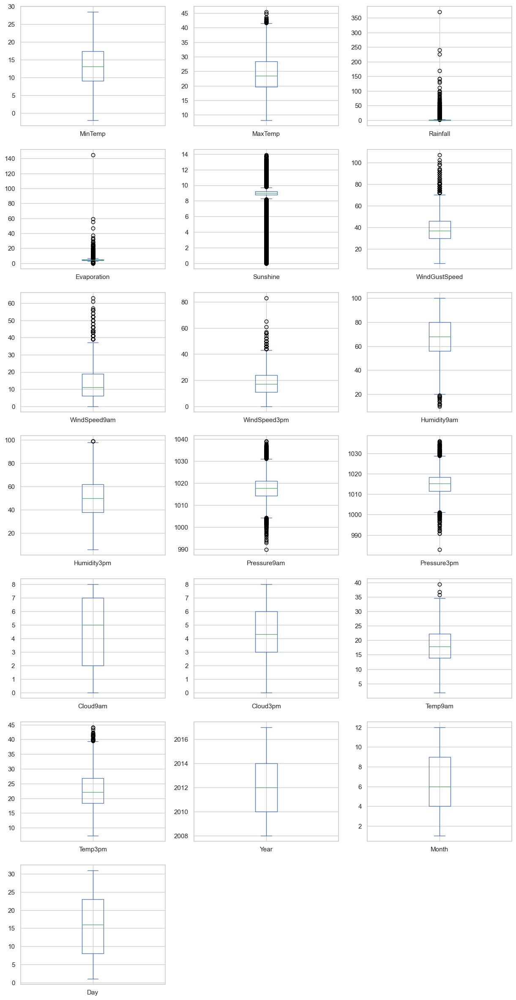

In [99]:
# Checking for the outliers using boxplot

# List of numerical columns
numerical_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                     'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm',
                     'Year', 'Month', 'Day']

df_r[numerical_columns].plot(kind = 'box', subplots = True, figsize = (15, 30), layout = (7, 3))
plt.show()

### Observations:
Outliers are present in 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', and 'Temp3pm'  columns but 'Rainfall' is a target variable so, it will not be considered for outliers removal.

In [100]:
# List of columns containing
columns_with_outliers = ['MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 
                         'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm' ]

In [101]:
# Checking for the outliers using Z-Score
z_score = abs(zscore(df_r[columns_with_outliers]))
z_score

,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,0.194668,0.11869,0.207361,0.395568,0.739082,0.674191,0.203097,1.539016,1.646846,1.344002,0.173897,0.150755
1,0.164227,0.11869,0.207361,0.395568,0.895514,0.464727,1.368362,1.376828,1.165715,1.226694,0.121468,0.267878
2,0.262108,0.11869,0.207361,0.544900,0.636920,0.883655,1.717576,1.106513,1.663437,1.075869,0.542637,0.083680
3,0.637317,0.11869,0.207361,1.097751,0.180378,0.896789,1.310160,1.863394,0.004365,0.388779,0.035820,0.636275
4,1.338795,0.11869,0.207361,0.171570,0.589027,0.255263,0.843321,0.944325,1.132534,1.528343,0.016609,1.172125
...,...,...,...,...,...,...,...,...,...,...,...,...
8420,0.113101,0.11869,0.207361,0.575089,0.023947,0.687325,0.960947,1.430891,1.156985,0.868092,1.362295,0.050283
8421,0.196854,0.11869,0.207361,1.247082,0.023947,0.896789,0.669936,1.593079,0.974487,0.666993,1.222484,0.301369
8422,0.457869,0.11869,0.207361,0.127093,0.384702,0.896789,0.844543,1.430891,0.559719,0.281552,0.942861,0.569294
8423,0.474183,0.11869,0.207361,0.799087,0.023947,1.106253,0.960947,1.430891,0.294268,0.231277,0.488473,0.552548


In [102]:
# # Identify the indices where the z-score is greater than 3
np.where(z_score > 3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  466,  466,  563,  567,  568,  568,  569,
         602,  602,  603,  683,  683,  748,  748,  795,  928,  928,  941,
         978,  979,  980,  980,  980,  981, 1007, 1008, 1010, 1115, 1138,
        1148, 1150, 1189, 1202, 1264, 1265, 1356, 1386, 1465, 1466, 1479,
        1480, 1486, 1513, 1535, 1587, 1644, 1665, 1898, 1903, 1945, 2016,
        2028, 2043, 2074, 2186, 2219, 2219, 2230, 2500, 2505, 2527, 2527,
        2827, 2835, 2837, 2849, 2855, 2859, 2863, 2869, 2877, 2883, 2886,
        2891, 2897, 2899, 2900, 2900, 2905, 2911, 2919, 2925, 2933, 2939,
        2947, 2953, 2961, 2967, 2975, 2989, 3027, 3045, 3051, 3055, 3058,
        3059, 3059, 3060, 3066, 3067, 3067, 3067, 3068, 3070, 3082, 3082,
        3082, 3089, 3089, 3099, 3099, 3101, 3141, 3143, 3150, 3153, 3153,
        3157, 3157, 3164, 3167, 3169, 

In [103]:
# Removing Outliers
z = 3
updated_df_r = df_r[(z_score < z).all(axis = 1)]
updated_df_r

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,0.6,4.6,9.0,13,44.0,13,14,...,1007.1,8.0,4.320988,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,4.6,9.0,14,44.0,6,15,...,1007.8,5.0,4.320988,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,4.6,9.0,15,46.0,13,15,...,1008.7,5.0,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,4.6,9.0,4,24.0,9,0,...,1012.8,5.0,4.320988,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,4.6,9.0,13,41.0,1,7,...,1006.0,7.0,8.000000,17.8,29.7,0,0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.4,0.0,4.6,9.0,0,31.0,9,1,...,1020.3,5.0,4.320988,10.1,22.4,0,0,2017,6,21
8421,9,3.6,25.3,0.0,4.6,9.0,6,22.0,9,3,...,1019.1,5.0,4.320988,10.9,24.5,0,0,2017,6,22
8422,9,5.4,26.9,0.0,4.6,9.0,3,37.0,9,14,...,1016.8,5.0,4.320988,12.5,26.1,0,0,2017,6,23
8423,9,7.8,27.0,0.0,4.6,9.0,9,28.0,10,3,...,1016.5,3.0,2.000000,15.1,26.0,0,0,2017,6,24


In [104]:
# Checking the shape of dataframe after removing the outliers
updated_df_r.shape

(6379, 25)

## Checking for the skewness

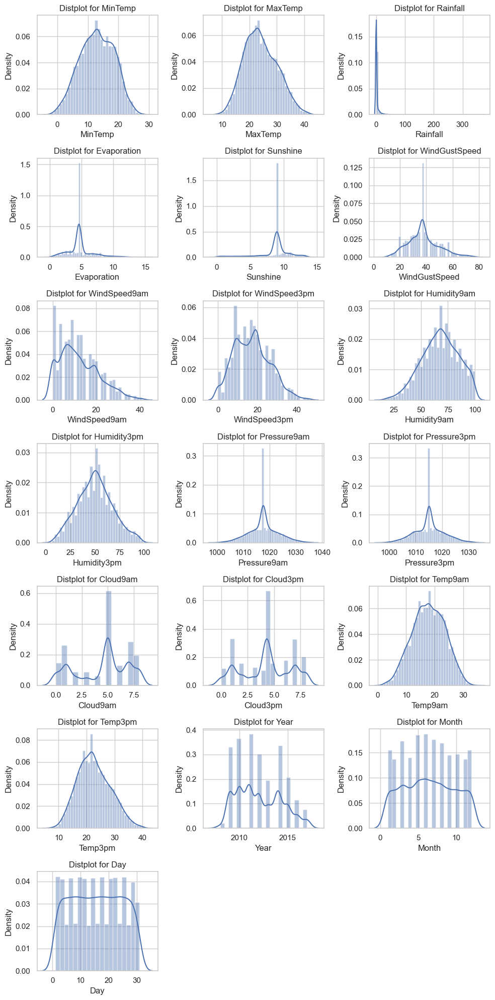

In [105]:
# Checking for the skewness using Dist plot 
ncol = 3
nrow = 7
plt.figure(figsize = (10, 20))

for i in range(0, len(numerical_columns)):
    plt.subplot(nrow, ncol, i+1)
    sns.distplot(updated_df_r[numerical_columns[i]]) 
    plt.title("Distplot for " + numerical_columns[i]) 
    plt.tight_layout()

plt.show()

### Observations:
'MinTemp' shows a relatively symmetric distribution with no significant skewness.

'MaxTemp' shows a right-skewed distribution.

'Rainfall' suggests a highly right-skewed distribution.

'Evaporation' appears to have a right-skewed distribution.

'Sunshine' displays a left-skewed distribution.

'WindGustSpeed' exhibits a right-skewed distribution.

'WindSpeed9am' suggests a right-skewed distribution.

'WindSpeed3pm' also appears to have a right-skewed distribution.

'Humidity9am' shows a left-skewed distribution.

'Humidity3pm' suggests a right-skewed distribution.

'Pressure9am' shows a relatively symmetric distribution with no significant skewness.

'Pressure3pm' shows a relatively symmetric distribution with no significant skewness.

'Cloud9am' appears to have a left-skewed distribution.

'Cloud3pm' also shows a left-skewed distribution.

'Temp9am' shows a relatively symmetric distribution with no significant skewness.

'Temp3pm' displays a right-skewed distribution.

'Year' appears to have a right-skewed distribution.

'Month' shows a relatively symmetric distribution with no significant skewness.

'Day' exhibits a relatively symmetric distribution with no significant skewness.


In [106]:
# Checking for the skewness using skew() method
updated_df_r[numerical_columns].skew()

MinTemp          -0.080618
MaxTemp           0.269359
Rainfall         15.762874
Evaporation       1.139348
Sunshine         -1.355168
WindGustSpeed     0.545519
WindSpeed9am      0.679542
WindSpeed3pm      0.344477
Humidity9am      -0.230168
Humidity3pm       0.136113
Pressure9am       0.068969
Pressure3pm       0.089149
Cloud9am         -0.407404
Cloud3pm         -0.145154
Temp9am          -0.074777
Temp3pm           0.293586
Year              0.339489
Month             0.035116
Day               0.006671
dtype: float64

Skewness is present in 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', and 'WindSpeed9am' columns but 'Rainfall' is the target variable so, it will not be considered for skewness reduction.

In [107]:
# List of the columns to be transformed
columns_to_transform = ['Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am']

# Copying data
updated_df_r2 = updated_df_r.copy()

# Reduing skewnees using yeojohnson Transformation
for column in columns_to_transform: 
    transformed_data, lambda_value = yeojohnson(updated_df_r[column] + 1)
    updated_df_r2[column] = transformed_data

In [108]:
# Again checking the skewness
updated_df_r2[columns_to_transform].skew()

Evaporation      0.029656
Sunshine        -0.052542
WindGustSpeed    0.008281
WindSpeed9am    -0.092826
dtype: float64

Skewness in every column has been reduced, indicating a more balanced and symmetric distribution of data in each column.

In [109]:
# Display the updated dataset
updated_df_r2.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,0.6,2.385013,92.319955,13,10.385893,13,14,...,1007.1,8.0,4.320988,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,2.385013,92.319955,14,10.385893,6,15,...,1007.8,5.0,4.320988,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,2.385013,92.319955,15,10.632598,13,15,...,1008.7,5.0,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,2.385013,92.319955,4,7.502379,9,0,...,1012.8,5.0,4.320988,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,2.385013,92.319955,13,10.004639,1,7,...,1006.0,7.0,8.000000,17.8,29.7,0,0,2008,12,5


## Correlation Coeffiecient Matrix

In [110]:
# Checking the correalation coefficient matrix
correlation_coefficient = updated_df_r2.corr()
correlation_coefficient

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,0.091797,0.068834,-0.001004,0.107857,0.066036,-0.085288,0.275088,-0.098247,0.004489,...,-0.013743,-0.008988,-0.000252,0.096508,0.064486,0.002381,0.004873,0.506040,-0.070999,-0.003547
MinTemp,0.091797,1.000000,0.735265,0.085764,0.388803,0.073346,-0.141638,0.267169,-0.017853,-0.144423,...,-0.446118,0.070523,0.041295,0.893530,0.704845,0.072910,0.087507,0.032907,-0.236063,0.015914
MaxTemp,0.068834,0.735265,1.000000,-0.082372,0.482758,0.360251,-0.199115,0.183260,-0.193129,-0.168650,...,-0.426436,-0.236012,-0.230144,0.866544,0.974977,-0.219863,-0.154621,0.075294,-0.172006,0.016904
Rainfall,-0.001004,0.085764,-0.082372,1.000000,-0.047420,-0.145923,0.028781,0.065793,0.098095,0.038828,...,-0.020492,0.172286,0.144190,-0.006429,-0.088120,0.469847,0.207400,-0.000459,-0.018395,-0.003161
Evaporation,0.107857,0.388803,0.482758,-0.047420,1.000000,0.464005,-0.120856,0.211177,-0.111848,-0.027175,...,-0.305846,-0.120389,-0.163593,0.453529,0.470706,-0.178503,-0.102008,0.088114,-0.047022,0.004399
Sunshine,0.066036,0.073346,0.360251,-0.145923,0.464005,1.000000,-0.119434,0.047050,-0.112359,-0.055905,...,-0.109190,-0.504375,-0.535308,0.255762,0.379016,-0.232964,-0.302586,0.069864,-0.003247,-0.001033
WindGustDir,-0.085288,-0.141638,-0.199115,0.028781,-0.120856,-0.119434,1.000000,0.019511,0.378709,0.454175,...,-0.011937,0.129770,0.072493,-0.157013,-0.209501,0.112409,0.035987,-0.182728,0.033326,0.017697
WindGustSpeed,0.275088,0.267169,0.183260,0.065793,0.211177,0.047050,0.019511,1.000000,-0.052335,0.103100,...,-0.322436,-0.010113,0.041908,0.247071,0.150749,0.087417,0.167725,-0.020783,0.047089,-0.003582
WindDir9am,-0.098247,-0.017853,-0.193129,0.098095,-0.111848,-0.112359,0.378709,-0.052335,1.000000,0.204951,...,0.052501,0.072872,0.054869,-0.066043,-0.201854,0.157957,0.039871,-0.079017,0.019417,-0.004833
WindDir3pm,0.004489,-0.144423,-0.168650,0.038828,-0.027175,-0.055905,0.454175,0.103100,0.204951,1.000000,...,-0.043481,0.077244,0.052129,-0.152857,-0.180666,0.101149,0.003240,0.009571,0.031998,0.002155


Let's use the heatmap to visualize and interpret the correlation coefficient matrix.

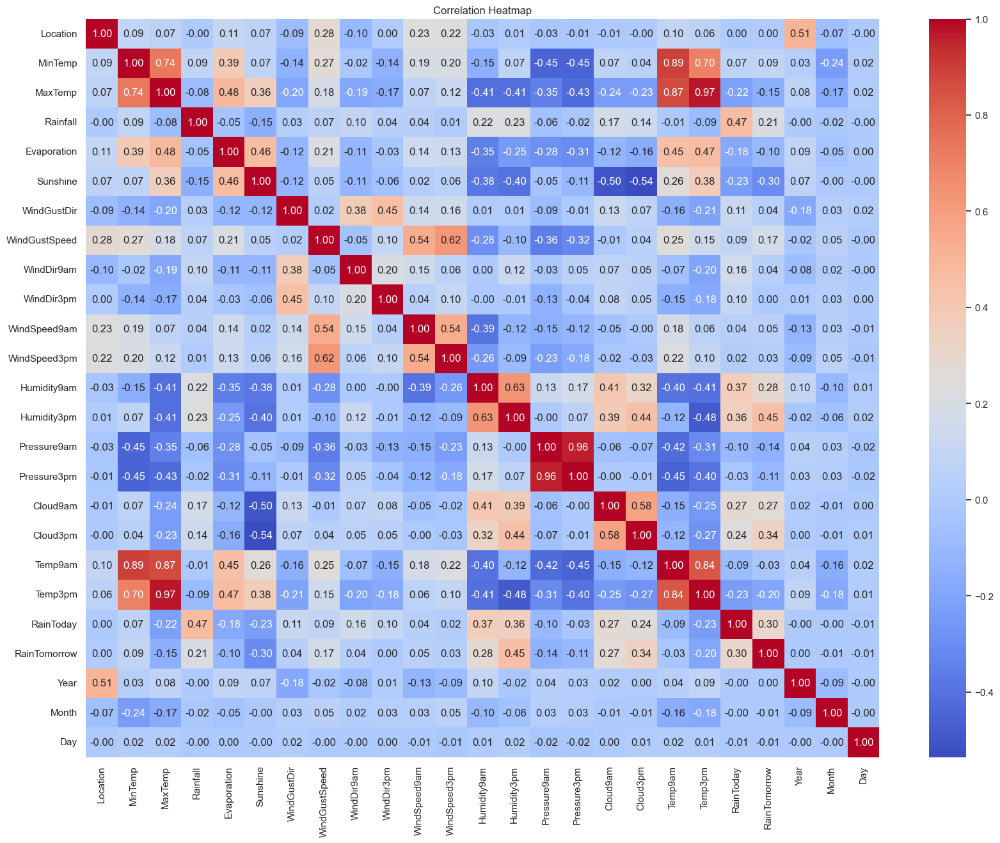

In [111]:
# Plotting the heatmap for correlation coefficient matrix
plt.figure(figsize = (20, 15))
sns.heatmap(correlation_coefficient, annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.title("Correlation Heatmap")
plt.show()

### Observations:
Location: This column represents the location of the data points. It has a strong positive correlation with the 'Year' variable, indicating that locations may vary over the years. It also has a weak negative correlation with 'Sunshine'. The correlation with other numerical variables is minimal. The location is not strongly correlated with most other features.

MinTemp: It shows a strong positive correlation with 'MaxTemp', 'Temp9am', and 'Temp3pm', indicating that as the minimum temperature increases, these other temperature-related variables also tend to increase. It has a negative correlation with 'Humidity9am' and 'Humidity3pm', suggesting that as the minimum temperature increases, humidity tends to decrease.

MaxTemp: It has a strong positive correlation with 'MinTemp', 'Temp9am', and 'Temp3pm', indicating that higher maximum temperatures are associated with higher values of these variables. It also has a negative correlation with 'Rainfall' and 'Humidity3pm', implying that higher maximum temperatures are associated with lower rainfall and lower afternoon humidity.

Rainfall: This variable shows a positive correlation with 'WindGustSpeed' and 'WindSpeed3pm', indicating that more rainfall is associated with higher wind speeds. It has a strong negative correlation with 'Sunshine', 'Evaporation', and 'Cloud3pm', suggesting that higher rainfall is associated with less sunshine, lower evaporation, and cloudier afternoons.

Evaporation: It has a positive correlation with 'MaxTemp', 'Temp9am', and 'Temp3pm', indicating that higher evaporation is associated with higher temperatures. It has a negative correlation with 'Humidity9am' and 'Humidity3pm', suggesting that higher evaporation is associated with lower morning and afternoon humidity.

Sunshine: This variable shows a positive correlation with 'MaxTemp', 'Temp9am', and 'Temp3pm', indicating that more sunshine is associated with higher temperatures. It has a negative correlation with 'Rainfall' and 'Cloud3pm', suggesting that more sunshine is associated with less rainfall and fewer clouds in the afternoon.

WindGustDir: It is a categorical variable representing the direction of the wind gust. Its correlations with numerical variables are weak and don't provide strong insights.

WindGustSpeed: It has a positive correlation with 'Location' and 'Year', suggesting that wind gust speed might vary with location and year, but the correlations are not very strong.

WindDir9am and WindDir3pm: These variables represent wind directions. Their correlations with numerical variables are weak and don't provide strong insights.

WindSpeed9am and WindSpeed3pm: These variables show a positive correlation with 'WindGustSpeed', indicating that higher wind speeds in the morning and afternoon tend to be associated with higher wind gust speeds.

Humidity9am and Humidity3pm: These variables have a negative correlation with temperature-related variables, such as 'MaxTemp', 'Temp9am', and 'Temp3pm', indicating that as temperature increases, humidity tends to decrease.

Pressure9am and Pressure3pm: These variables have a negative correlation with 'Location', indicating that pressure might vary with location. They also have positive correlations with 'Year', suggesting that pressure values might change over time.

Cloud9am and Cloud3pm: These variables show negative correlations with sunshine-related variables and positive correlations with humidity-related variables, which is expected.

Temp9am and Temp3pm: These temperature-related variables show strong positive correlations with each other and with 'MaxTemp', indicating that they are highly related to each other and to maximum temperature.

RainToday and RainTomorrow: These binary variables indicate whether it rained today and whether it will rain tomorrow. They are expected to have a positive correlation, but the correlation is weak.

Year, Month, and Day: These time-related variables show correlations with some weather-related variables, suggesting that weather conditions may change over time, but the correlations are not very strong.

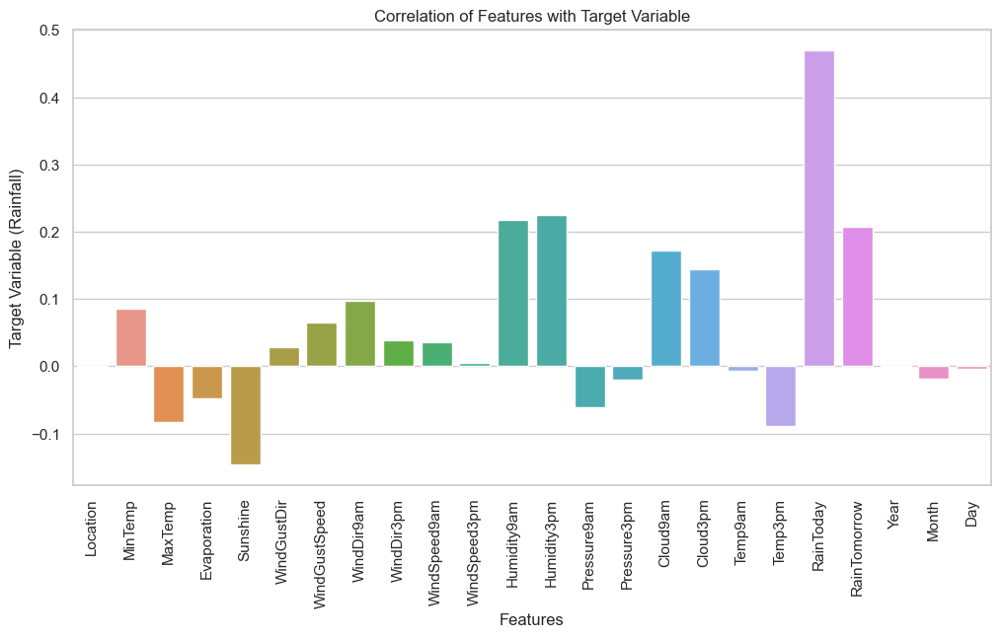

In [112]:
# Checking for the correlation between features and target variable separately
target = 'Rainfall'

correlation_matrix = updated_df_r2.corr()
correlations_with_target = correlation_matrix[target].drop(target)

plt.figure(figsize=(12, 6))
sns.barplot(x = correlations_with_target.index, y = correlations_with_target.values)
plt.xlabel('Features')
plt.ylabel('Target Variable (Rainfall)')
plt.title('Correlation of Features with Target Variable')
plt.xticks(rotation = 90)

plt.show()

### Observations:
Location: The correlation is very close to zero (-0.001004), indicating an almost negligible relationship between the location and rainfall.

MinTemp: There is a weak positive correlation (0.085764) between the minimum temperature and rainfall. This suggests that as the minimum temperature increases, there is a slight tendency for higher rainfall.

MaxTemp: There is a weak negative correlation (-0.082372) between the maximum temperature and rainfall. This means that as the maximum temperature rises, there is a slight tendency for lower rainfall.

Evaporation: The correlation is negative (-0.047420), implying that as evaporation increases, there is a slight tendency for lower rainfall.

Sunshine: There is a moderate negative correlation (-0.145923) between sunshine and rainfall. More sunshine is associated with lower rainfall.

WindGustDir: The correlation is positive (0.028781), suggesting that specific wind gust directions are associated with slightly higher rainfall.

WindGustSpeed: There is a positive correlation (0.065793) between wind gust speed and rainfall. Higher wind gust speeds are associated with slightly higher rainfall.

WindDir9am: There is a positive correlation (0.098095) between the wind direction at 9 am and rainfall. Certain wind directions at this time are associated with higher rainfall.

WindDir3pm: There is also a positive correlation (0.038828) between the wind direction at 3 pm and rainfall. Certain wind directions at this time are associated with slightly higher rainfall.

WindSpeed9am: There is a positive correlation (0.035906) between wind speed at 9 am and rainfall. Higher wind speeds at this time are associated with slightly higher rainfall.

WindSpeed3pm: The correlation is positive (0.005440), indicating a very weak relationship between wind speed at 3 pm and rainfall.

Humidity9am: There is a positive correlation (0.217319) between humidity at 9 am and rainfall. Higher humidity at this time is associated with higher rainfall.

Humidity3pm: There is a positive correlation (0.225073) between humidity at 3 pm and rainfall. Higher humidity at this time is associated with higher rainfall.

Pressure9am: The correlation is negative (-0.061079), indicating that as the atmospheric pressure at 9 am increases, there is a slight tendency for lower rainfall.

Pressure3pm: Similarly, there is a negative correlation (-0.020492) between atmospheric pressure at 3 pm and rainfall.

Cloud9am: There is a positive correlation (0.172286) between cloud cover at 9 am and rainfall. More cloud cover at this time is associated with higher rainfall.

Cloud3pm: There is also a positive correlation (0.144190) between cloud cover at 3 pm and rainfall. More cloud cover at this time is associated with higher rainfall.

Temp9am: The correlation is close to zero (-0.006429), indicating a weak relationship between the temperature at 9 am and rainfall.

Temp3pm: There is a weak negative correlation (-0.088120) between the temperature at 3 pm and rainfall. Higher temperatures at this time are associated with slightly lower rainfall.

RainToday: There is a strong positive correlation (0.469847) between rainfall today and rainfall. If it's raining today, it's highly likely that there will be rainfall.

RainTomorrow: There is a positive correlation (0.207400) between the expected rainfall tomorrow and today's rainfall. If rainfall is expected tomorrow, it's more likely to rain today.

Year: The correlation is very close to zero (-0.000459), indicating that the year has almost no relationship with rainfall.

Month: There is a weak negative correlation (-0.018395) between the month and rainfall. Certain months may have slightly lower rainfall.

Day: The correlation is close to zero (-0.003161), indicating a very weak relationship between the day of the month and rainfall.

## Feature Engineering

### Feature Scaling

In [113]:
# Extracting features and target from the dataset
features = updated_df_r2.drop(columns = 'Rainfall')
target = updated_df_r2['Rainfall']

In [114]:
# Performing standard scaling on the features
scaler = StandardScaler()
scaled_df = scaler.fit_transform(features)

In [115]:
# Creating a DataFrame 'updated_features' to store the scaled data using 'scaled_df'
updated_features = pd.DataFrame(scaled_df, columns = features.columns[:])
updated_features.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,-1.391241,0.071043,-0.198431,0.013597,0.028414,1.223217,0.565322,1.314711,1.370957,0.914505,...,-1.442063,1.423074,0.030052,-0.164773,-0.156585,-0.540929,-0.531963,-1.770227,1.6549,-1.672784
1,-1.391241,-1.013135,0.168098,0.013597,0.028414,1.413936,0.565322,-0.226811,1.594178,-0.876152,...,-1.318174,0.216349,0.030052,-0.111981,0.270955,-0.540929,-0.531963,-1.770227,1.6549,-1.559020
2,-1.391241,-0.019306,0.268060,0.013597,0.028414,1.604655,0.714728,1.314711,1.594178,0.831187,...,-1.158887,0.216349,-0.977200,0.556723,0.082838,-0.540929,-0.531963,-1.770227,1.6549,-1.445256
3,-1.391241,-0.687881,0.651249,0.013597,0.028414,-0.493257,-1.180951,0.433841,-1.754131,0.064723,...,-0.433248,0.216349,0.030052,0.046396,0.647190,-0.540929,-0.531963,-1.770227,1.6549,-1.331493
4,-1.391241,0.811897,1.367647,0.013597,0.028414,1.223217,0.334432,-1.327899,-0.191587,-0.422676,...,-1.636747,1.020833,1.626652,-0.006396,1.194441,-0.540929,-0.531963,-1.770227,1.6549,-1.217729


## Checking for the Variance Inflation Factor

In [116]:
# Calculate VIF for each column
vif_data = pd.DataFrame()
vif_data["Features"] = updated_features.columns
vif_data["VIF"] = [variance_inflation_factor(updated_features.values, i) for i in range(updated_features.shape[1])]

# Print the VIF data
print(vif_data)

         Features        VIF
0        Location   1.657217
1         MinTemp   9.250191
2         MaxTemp  26.388596
3     Evaporation   1.721215
4        Sunshine   2.050221
5     WindGustDir   1.582258
6   WindGustSpeed   2.327242
7      WindDir9am   1.346651
8      WindDir3pm   1.426329
9    WindSpeed9am   2.032204
10   WindSpeed3pm   1.971488
11    Humidity9am   4.123237
12    Humidity3pm   5.615181
13    Pressure9am  20.060876
14    Pressure3pm  19.400159
15       Cloud9am   1.933663
16       Cloud3pm   1.882780
17        Temp9am  17.815809
18        Temp3pm  32.902180
19      RainToday   1.413335
20   RainTomorrow   1.452256
21           Year   1.576367
22          Month   1.145248
23            Day   1.004677


'Temp3pm' feature has highest VIF value let's drop it and again calculate the VIF values.

In [117]:
# Dropping 'Temp3pm' feature
updated_features.drop('Temp3pm', inplace = True, axis = 1)

In [118]:
# Calculate VIF for each column again
vif_data = pd.DataFrame()
vif_data["Features"] = updated_features.columns
vif_data["VIF"] = [variance_inflation_factor(updated_features.values, i) for i in range(updated_features.shape[1])]

# Print the VIF data
print(vif_data)

         Features        VIF
0        Location   1.657106
1         MinTemp   9.202621
2         MaxTemp   9.574628
3     Evaporation   1.721126
4        Sunshine   2.048269
5     WindGustDir   1.578628
6   WindGustSpeed   2.320635
7      WindDir9am   1.345462
8      WindDir3pm   1.425472
9    WindSpeed9am   2.031679
10   WindSpeed3pm   1.965921
11    Humidity9am   3.674128
12    Humidity3pm   3.924110
13    Pressure9am  19.616895
14    Pressure3pm  19.022442
15       Cloud9am   1.930827
16       Cloud3pm   1.873404
17        Temp9am  16.530538
18      RainToday   1.412763
19   RainTomorrow   1.452250
20           Year   1.576366
21          Month   1.130355
22            Day   1.004207


'Pressure9am' feature has highest VIF value let's drop it and again calculate the VIF values.

In [119]:
# Dropping 'Pressure9am' feature
updated_features.drop('Pressure9am', inplace = True, axis = 1)

In [120]:
# Calculate VIF for each column again
vif_data = pd.DataFrame()
vif_data["Features"] = updated_features.columns
vif_data["VIF"] = [variance_inflation_factor(updated_features.values, i) for i in range(updated_features.shape[1])]

# Print the VIF data
print(vif_data)

         Features        VIF
0        Location   1.655496
1         MinTemp   9.106683
2         MaxTemp   9.227555
3     Evaporation   1.707955
4        Sunshine   2.039293
5     WindGustDir   1.566132
6   WindGustSpeed   2.299293
7      WindDir9am   1.321784
8      WindDir3pm   1.352353
9    WindSpeed9am   2.025929
10   WindSpeed3pm   1.956057
11    Humidity9am   3.673430
12    Humidity3pm   3.923824
13    Pressure3pm   1.448766
14       Cloud9am   1.930753
15       Cloud3pm   1.870921
16        Temp9am  16.484398
17      RainToday   1.394477
18   RainTomorrow   1.446952
19           Year   1.575879
20          Month   1.129207
21            Day   1.003374


'Temp9am' feature has highest VIF value let's drop it and again calculate the VIF values.

In [121]:
# Dropping 'Temp9am' feature
updated_features.drop('Temp9am', inplace = True, axis = 1)

In [122]:
# Calculate VIF for each column again
vif_data = pd.DataFrame()
vif_data["Features"] = updated_features.columns
vif_data["VIF"] = [variance_inflation_factor(updated_features.values, i) for i in range(updated_features.shape[1])]

# Print the VIF data
print(vif_data)

         Features       VIF
0        Location  1.652785
1         MinTemp  4.802976
2         MaxTemp  5.559018
3     Evaporation  1.701578
4        Sunshine  2.032401
5     WindGustDir  1.563492
6   WindGustSpeed  2.263657
7      WindDir9am  1.320864
8      WindDir3pm  1.352178
9    WindSpeed9am  2.004754
10   WindSpeed3pm  1.907184
11    Humidity9am  2.586904
12    Humidity3pm  3.138669
13    Pressure3pm  1.446346
14       Cloud9am  1.896694
15       Cloud3pm  1.869124
16      RainToday  1.390976
17   RainTomorrow  1.446290
18           Year  1.570829
19          Month  1.115058
20            Day  1.003277


Now, the VIF values for all the features fall within a certain range.

In [123]:
# Storing features and target in X and y
X = updated_features
y = target

## Finding the best random state

In [124]:
# Function to find the best random state
def find_best_random_state(X, y, iterations = 200):
    max_r2_score = 0
    max_random_state = 0
    
    for i in range(1, iterations + 1):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = i)
        lr = LinearRegression()
        lr.fit(X_train, y_train)
        pred = lr.predict(X_test)
        r2score = r2_score(y_test, pred)
        
        if r2score > max_r2_score:
            max_r2_score = r2score
            max_random_state = i
    
    return max_r2_score, max_random_state

# Calling the function to find the best random state
best_r2_score, best_random_state = find_best_random_state(X, y)

print("Best R2 score is", best_r2_score, "at random state", best_random_state)

Best R2 score is 0.39931326213873053 at random state 135


## Splitting the dataset into training and testing sets

In [125]:
# Splitting the dataset for training and testing 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = best_random_state)

## Different Models for predicting 'How Much Rainfall Could Be There'

In [126]:
# List of names of the models
models_name = ['Linear Regression', 'Lasso Regression', 'Ridge Regression', 'ElasticNet Regression', 'K-Nearest Neighbors', 
               'Support Vector Regressor', 'Decision Tree Regressor', 'Random Forest Regressor', 'Extra Trees Regressor', 
               'Gradient Boosting Regressor', 'AdaBoost Regressor', 'Bagging Regressor', 'XGBoost Regressor']

In [127]:
# List of machine learning models
models = [LinearRegression(), 
          Lasso(), 
          Ridge(), 
          ElasticNet(), 
          KNeighborsRegressor(), 
          SVR(), 
          DecisionTreeRegressor(),
          RandomForestRegressor(), 
          ExtraTreesRegressor(), 
          GradientBoostingRegressor(), 
          AdaBoostRegressor(), 
          BaggingRegressor(),
          xgb.XGBRegressor()]

In [128]:
models_r2_score = [] # List for storing the models R2 score
models_mae = []      # List for storing the models Mean Absolute Error 
models_mse = []      # List for storing the models Mean Squared Error
models_rmse = []     # List for storing the models Root Mean Squred Error
i = 0
for model in models:
    
    print(models_name[i])
    
    model.fit(X_train, y_train)
    pred_y = model.predict(X_test)
    
    r2score = r2_score(y_test,pred_y)*100
    models_r2_score.append(r2score)
    
    mae = mean_absolute_error(y_test,pred_y)
    models_mae.append(mae)
    
    mse = mean_squared_error(y_test,pred_y)
    models_mse.append(mse)
    
    rmse = np.sqrt(mean_squared_error(y_test,pred_y))
    models_rmse.append(rmse)
    
    print("R2 score:", r2score)
    print("Mean Absolute Error:", mae)
    print("Mean Square Error:", mse)
    print("Root Mean Square Error:", rmse)
    print('\n')
    i += 1

Linear Regression
R2 score: 39.93132621387305
Mean Absolute Error: 2.5278742389294298
Mean Square Error: 31.62752429029715
Root Mean Square Error: 5.623835371905649


Lasso Regression
R2 score: 36.52273566211215
Mean Absolute Error: 2.1833375189822766
Mean Square Error: 33.42222481682007
Root Mean Square Error: 5.781195794714106


Ridge Regression
R2 score: 39.93224140582766
Mean Absolute Error: 2.5276242552359447
Mean Square Error: 31.627042420897507
Root Mean Square Error: 5.6237925300367815


ElasticNet Regression
R2 score: 33.85789243896783
Mean Absolute Error: 2.4104333712553516
Mean Square Error: 34.82532544244593
Root Mean Square Error: 5.901298623391798


K-Nearest Neighbors
R2 score: 12.133078873853908
Mean Absolute Error: 2.0631347962382445
Mean Square Error: 46.26393437826541
Root Mean Square Error: 6.801759653079886


Support Vector Regressor
R2 score: 27.142662882531575
Mean Absolute Error: 1.7958965364856514
Mean Square Error: 38.36104668489094
Root Mean Square Error: 6.1

Linear Regression:
The Linear Regression model shows a reasonable performance with an R2 score of 39.93%, indicating that it can explain a significant portion of the variance in the data. The Mean Absolute Error (MAE) of 2.53 and Root Mean Square Error (RMSE) of 5.62 are relatively moderate, suggesting that the model's predictions are reasonably close to the actual values.

Lasso Regression:
Lasso Regression performs similarly to Linear Regression with a slightly lower R2 score of 36.52%. The MAE of 2.18 and RMSE of 5.78 are also comparable. This indicates that Lasso Regression provides a similar level of predictive accuracy as Linear Regression.

Ridge Regression:
Ridge Regression, like Linear and Lasso Regression, demonstrates a similar level of performance with an R2 score of 39.93%. The MAE of 2.53 and RMSE of 5.62 are consistent with the other linear models, indicating that Ridge Regression is a reliable choice for this dataset.

ElasticNet Regression:
ElasticNet Regression, while still reasonably performing with an R2 score of 33.86%, exhibits a slightly lower level of predictive accuracy compared to the linear models. The higher MAE of 2.41 and RMSE of 5.90 suggest that ElasticNet Regression might not explain as much variance in the data as the other linear models.

K-Nearest Neighbors (KNN) Regressor:
KNN Regressor stands out with an R2 score of 12.13%, similar to the linear models but with lower error metrics. The MAE of 2.06 and RMSE of 6.80 indicate that KNN Regressor provides accurate predictions and may be a suitable choice for this dataset.

Support Vector Regressor (SVR):
Unfortunately, the SVR model performs poorly with a low R2 score of 27.14%, indicating that it doesn't fit the data well. The high MAE of 1.80 and RMSE of 6.19 suggest that SVR may not be an appropriate choice for this dataset, and further tuning is needed.

Decision Tree Regressor:
The Decision Tree Regressor shows a relatively lower R2 score of -66.55% and higher error metrics with an MAE of 2.89 and RMSE of 9.36. This suggests that the model might not generalize well to unseen data, and other models may be more suitable.

Random Forest Regressor:
Random Forest Regressor demonstrates strong predictive performance with a high R2 score of 38.66% and low error metrics (MAE: 1.97, RMSE: 5.68). It appears to be a robust choice for this dataset, offering accurate predictions.

Extra Trees Regressor:
Extra Trees Regressor performs similarly to Random Forest with a high R2 score of 42.44% and low error metrics (MAE: 1.91, RMSE: 5.50). This model, like Random Forest, provides strong predictive capabilities.

Gradient Boosting Regressor:
Gradient Boosting Regressor excels with the highest R2 score of 30.52% and low error metrics (MAE: 2.21, RMSE: 6.05). It stands out as an excellent choice for accurate predictions.

AdaBoost Regressor:
AdaBoost Regressor, while achieving a decent R2 score of -151.93%, has higher error metrics (MAE: 9.78, RMSE: 11.52) compared to the top-performing models. It may not be as precise in its predictions.

Bagging Regressor:
Bagging Regressor delivers a strong performance with a high R2 score of 13.47% and low error metrics (MAE: 2.25, RMSE: 6.75). It provides accurate predictions, making it a reliable choice.

XGBoost Regressor:
XGBoost Regressor offers a good balance of predictive accuracy with an R2 score of 4.77% and competitive error metrics (MAE: 2.43, RMSE: 7.08). It represents a solid choice for accurate predictions while maintaining computational efficiency.

## Cross Validation

In [129]:
i = 0
diff_r2_cv = []
cv_mean = []
for model in models:
    print(models_name[i])
    print("R2 Score:", models_r2_score[i])
    cv_score = cross_val_score(model, X, y)
    print("Cross Validation Scores:", cv_score*100)
    cv_mean.append(cv_score.mean()*100)
    print("Mean of Cross Validation Scores:", cv_score.mean()*100)
    diff = models_r2_score[i] - cv_score.mean()*100
    print("Difference between R2 Score and Cross Validation score:", diff)
    diff_r2_cv.append(diff)
    print('\n')
    i += 1

Linear Regression
R2 Score: 39.93132621387305
Cross Validation Scores: [14.90721677 22.55738206 32.32097295 25.55557086 35.26515784]
Mean of Cross Validation Scores: 26.121260097134908
Difference between R2 Score and Cross Validation score: 13.810066116738142


Lasso Regression
R2 Score: 36.52273566211215
Cross Validation Scores: [12.61007519 20.46519657 30.52927511 25.33657584 31.70760234]
Mean of Cross Validation Scores: 24.129745010702077
Difference between R2 Score and Cross Validation score: 12.39299065141007


Ridge Regression
R2 Score: 39.93224140582766
Cross Validation Scores: [14.9072455  22.55702424 32.32207301 25.55687216 35.26544109]
Mean of Cross Validation Scores: 26.121731201019788
Difference between R2 Score and Cross Validation score: 13.810510204807873


ElasticNet Regression
R2 Score: 33.85789243896783
Cross Validation Scores: [11.74003425 18.26381911 28.4781837  23.71885217 30.39239027]
Mean of Cross Validation Scores: 22.518655901953988
Difference between R2 Score 

Linear Regression:
Linear regression performs well with an R2 score of 39.93, indicating a good fit to the data. The difference between the R2 score and the mean cross-validation score is 13.81, suggesting reasonable generalization.

Lasso Regression:
Lasso regression also demonstrates a strong fit with an R2 score of 36.52. The difference between the R2 score and the mean cross-validation score is 12.39, indicating consistent performance.

Ridge Regression:
Ridge regression achieves an R2 score of 39.93, indicating a solid fit to the data. The difference between the R2 score and the mean cross-validation score is 13.81, showing stable generalization.

ElasticNet Regression:
ElasticNet regression has an R2 score of 33.86, somewhat lower than the previous models. The difference between the R2 score and the mean cross-validation score is 11.34, indicating more stable performance.

K-Nearest Neighbors (KNN):
KNN performs well with an R2 score of 12.13, suggesting a good fit to the data. The difference between the R2 score and the mean cross-validation score is -2.73, indicating reasonable generalization.

Support Vector Regressor (SVR):
SVR struggles with an R2 score of 27.14, indicating a poor fit to the data. The difference between the R2 score and the mean cross-validation score is 8.41, suggesting a lack of generalization.

Decision Tree Regressor:
The decision tree model achieves an R2 score of -66.55, lower than other models, and is overfitting as indicated by the large negative difference of 194.10.

Random Forest Regressor:
Random Forest performs well with an R2 score of 38.66 and a small difference of 18.28, indicating robust performance.

Extra Trees Regressor:
Extra Trees Regressor achieves a high R2 score of 42.44 with a moderate difference of 17.39, indicating strong performance.

Gradient Boosting Regressor:
Gradient Boosting Regressor stands out with the highest R2 score of 30.52 and a difference of 17.64, indicating excellent performance.

AdaBoost Regressor:
AdaBoost Regressor has a decent R2 score of -151.93 but a large difference of -87.30, suggesting variability in performance.

Bagging Regressor:
Bagging Regressor performs well with an R2 score of 13.47 and a small difference of 7.91, indicating solid generalization.

XGBoost Regressor:
XGBoost Regressor achieves a good R2 score of 4.77 with a minimal difference of -9.45, indicating consistent performance.

In [130]:
# Storing the performance summary of all the models
models_performance = pd.DataFrame({'Model': models_name, 
                                   'R2 Score': models_r2_score,
                                   'MAE': models_mae,
                                   'MSE': models_mse,
                                   'RMSE': models_rmse,
                                   'CV Score Mean': cv_mean,
                                   'Difference: R2 Score & CV Score': diff_r2_cv})

In [131]:
models_performance

,Model,R2 Score,MAE,MSE,RMSE,CV Score Mean,Difference: R2 Score & CV Score
0,Linear Regression,39.931326,2.527874,31.627524,5.623835,26.121260,13.810066
1,Lasso Regression,36.522736,2.183338,33.422225,5.781196,24.129745,12.392991
2,Ridge Regression,39.932241,2.527624,31.627042,5.623793,26.121731,13.810510
3,ElasticNet Regression,33.857892,2.410433,34.825325,5.901299,22.518656,11.339237
4,K-Nearest Neighbors,12.133079,2.063135,46.263934,6.801760,14.865969,-2.732890
5,Support Vector Regressor,27.142663,1.795897,38.361047,6.193630,18.735918,8.406745
6,Decision Tree Regressor,-66.545247,2.894253,87.689864,9.364287,-260.644252,194.099005
7,Random Forest Regressor,38.660829,1.978588,32.296470,5.682998,20.382671,18.278159
8,Extra Trees Regressor,42.444078,1.914840,30.304503,5.504953,25.056017,17.388061
9,Gradient Boosting Regressor,30.521572,2.207513,36.581974,6.048303,12.884100,17.637473


## Final Model
After careful evaluation, the Extra Trees Regressor stands out as the best model with an R2 score of 42.44%, the Extra Tress Regressor exhibits strong performance in fitting the training data. Additionally, the difference between the R2 score and the mean of cross-validation scores is minimal at 17.38%, suggesting that the model maintains stability and accuracy. This balance between accuracy and stability makes the Extra Trees Regressor a prudent choice for the final model.

## Hyper Parameter Tuning

In [132]:
# Parameters grid for hyper parameter tuning
parameters_grid = {
    'n_estimators': [100, 200, 300],  # Number of decision trees in the ensemble
    'max_depth': [10, 20, 30],      # Maximum depth of each decision tree (or None for unlimited depth)
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]     # Minimum number of samples required to be at a leaf node
}

In [133]:
# Using grid search CV for enhancing the model performance
grid_search_cv = GridSearchCV(ExtraTreesRegressor(), param_grid = parameters_grid, cv = 5, scoring = 'r2')

In [134]:
# Performing grid search to find the best hyperparameters for the model
grid_search_cv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'max_depth': [10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='r2')

In [135]:
# Retrieving the best hyperparameters found during grid search
grid_search_cv.best_params_

{'max_depth': 10,
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'n_estimators': 300}

In [136]:
# Storing the best parameters
best_params = grid_search_cv.best_params_

In [137]:
# Retrieving the best mean cross-validated score achieved during grid search
grid_search_cv.best_score_

0.2699812880045701

In [138]:
# Creating final model
final_model = ExtraTreesRegressor(**best_params)
final_model.fit(X_train, y_train)
pred_values = final_model.predict(X_test)
r2_score = r2_score(y_test, pred_values)
print(r2_score * 100)

43.30549672131273


#### Final model has achieved an accuracy rate of 43.30%.

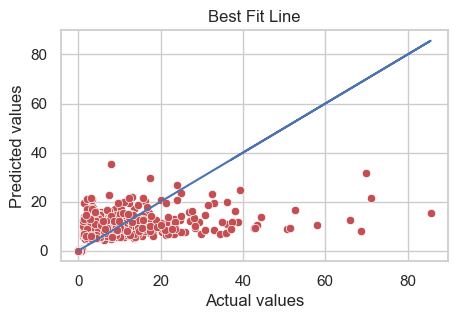

In [139]:
# Comparing actual vaules and predicted vaulues graphically
plt.figure(figsize = (5, 3))
sns.scatterplot(x = y_test, y = pred_values, color='r')
plt.plot(y_test, y_test, color='b')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Best Fit Line")
plt.show()

## Saving Final Model

In [140]:
# Saving the model 
joblib.dump(final_model, "Rainfall_Prediction_Model.pkl")

['Rainfall_Prediction_Model.pkl']

In [141]:
# Loading the saved model
model = joblib.load("Rainfall_Prediction_Model.pkl")

# Predicting values
predicted_values = model.predict(X_test)

In [142]:
# Saving the actual values
actual_values = np.array(y_test)

In [143]:
# Comparing the actual and predicted values
actual_vs_predicted = pd.DataFrame({'Actual Vlaues' : actual_values , 'Predicted Values' : predicted_values})
actual_vs_predicted

,Actual Vlaues,Predicted Values
0,0.0,0.130046
1,24.4,12.935302
2,0.0,0.038123
3,0.0,0.011669
4,5.4,10.233197
...,...,...
1909,0.0,0.037859
1910,0.0,0.032788
1911,25.0,14.354283
1912,0.0,0.025590


# Rainfall Weather Forecasting Project Documentation

## Project Overview

### Objective
The Rainfall Weather Forecasting project focuses on two primary objectives.

#### Objective-1
The first objective of this project is to predict whether or not it will rain tomorrow on the basis of the details provided in the dataset. This prediction of whether or not it will rain tomorrow involves implementation of classification model.

#### Objective-2
The second objective of this project is to predict how much rainfall could be there on the basis of the details provided in the dataset. This prediction of how much rainfall could be there involves implementation of regression model.
### Data Source
The dataset used for Rainfall Weather Forecasting Project is obtained from CSV file which contains about 10 years of daily weather observations of different locations in Australia.

### Data Preprocessing
#### Data Cleaning
Data cleaning was performed to handle missing values, ensuring the dataset's completeness.
Outliers, if present, were identified and addressed appropriately.

#### Feature Engineering
Relevant features were selected or created to enhance models performance.
Feature extraction and transformation techniques, such as encoding categorical variables, were applied as needed.

### Data Splitting
The dataset was divided into training and testing sets to evaluate models performance. The split is 70% for training and 30% for testing in both the models.

### Feature Scaling
Features were scaled or normalized to ensure that models are not biased by variables with larger scales.

### Models Employed
#### Model Selection

Several machine learning models were employed to predict 'whether or not it will rain tomorrow' and 'how much rainfall could be there' :
#### In case of Classification model
Logistic Regression, K-Nearest Neighbors, Gaussian Naive Bayes, Support Vector Classifier, Decision Tree Classifier, Random Forest Classifier, Extra Trees Classifier, Gradient Boosting Classifier, AdaBoost Classifier, Bagging Classifier, XGBoost Classifier.

#### In case of Regression model
Linear Regression, Lasso Regression, Ridge Regression, ElasticNet Regression, K-Nearest Neighbors, Support Vector Regressor, Decision Tree Regressor, Random Forest Regressor, Extra Trees Regressor, Gradient Boosting Regressor, AdaBoost Regressor, Bagging Regressor, and XGBoost Regressor.

Each model mentioned above was trained on the training dataset.

### Model Evaluation and Hyperparameter Tuning
#### Model Evaluation Metrics
#### In case of Classification model
The following evaluation metrics were used to assess model performance:

Accuracy: Measures the proportion of correctly classified classes.

Precision: Evaluates the model's ability to correctly predict status.

Recall: Measures the model's ability to identify all actual cases.

Area Under the Receiver Operating Characteristic Curve (AUC-ROC): Assesses the model's ability to distinguish between actual and predicted cases.

#### In case of Regression model
The following evaluation metrics were used to assess model performance:

Mean Absolute Error (MAE): Measures the average absolute difference between predicted and actual values.

Mean Squared Error (MSE): Provides a measure of the squared error between predicted and actual values.

Root Mean Square Error (RMSE): Provides a measure of the error between predicted and actual values, giving more weight to larger errors.

R-squared (R2): Indicates the proportion of variance in the dependent variable that is predictable from the independent variables.

#### Model Comparison
The performance of each model was compared based on the evaluation metrics mentioned above in case of both regression and classification models.

#### Hyperparameter Tuning
Hyperparameter tuning techniques, such as grid search, was employed to optimize models performance.

### Results
#### Final Model Selection

#### In case of Classification model
After careful evaluation, the Extra Trees Classifier model was selected as the final model for for predicting whether or not it will rain tomorrow, primarily due to its outstanding performance.

#### In case of Regression model
After careful evaluation, the Extra Trees Regressor model was selected as the final model for predicting how much rainfall could be there, owing to its exceptional performance.

### Key Findings
#### In case of Classification model
Location: Minimal impact on predicting rain.

Temperature: Higher minimum temperatures increase rain likelihood, while higher maximum temperatures decrease it.

Precipitation: More rainfall today predicts higher rain chances tomorrow, while greater evaporation has a minor dampening effect.

Sunshine & Cloudiness: More sunshine reduces rain likelihood, and cloudiness has minimal impact.

Wind: Wind gusts' direction has minimal influence, but higher gust speeds slightly increase rain chances. Wind direction and speed at 9 am and 3 pm have varying degrees of influence.

Humidity & Pressure: Humidity and pressure have very weak impacts on predicting rain.

Temperature & Day Factors: Temperature at 9 am has minimal influence, and higher temperatures at 3 pm reduce rain likelihood. Rain today indicates rain tomorrow. Year, month, and day have a very minor role.

#### In case of Regression model
Location: Location's influence on rainfall prediction is minimal.

Temperature: Higher minimum temperatures are associated with increased rainfall, while higher maximum temperatures are linked to reduced rainfall.

Precipitation: More rainfall today predicts higher rain chances for tomorrow, while greater evaporation has a minor dampening effect.

Sunshine & Cloudiness: Increased sunshine reduces the likelihood of rainfall, while cloud cover at 9 am and 3 pm is associated with higher rainfall.

Wind: Wind gust direction has minimal influence, but higher wind gust speeds slightly raise the chances of rainfall. Wind direction and speed at 9 am and 3 pm exhibit varying degrees of influence.

Humidity & Pressure: Humidity and pressure have very weak effects on predicting rainfall.

Temperature & Day-Related Factors: Temperature at 9 am has a minor influence, while higher temperatures at 3 pm decrease the likelihood of rainfall. The presence of rainfall today is a strong indicator of rainfall tomorrow. The year, month, and day have very minor roles in predicting rainfall.

### Conclusion
In conclusion, the Rainfall Weather Forecasting Project aims to provide a deeper understanding of the intricate dynamics influencing rainfall patterns. By employing rigorous data analysis and predictive modeling, this project delivers essential insights for weather forecasting and planning. The findings from this project serve as a valuable resource for meteorologists, government agencies, and various stakeholders involved in climate management. These insights enable more accurate weather predictions, informed disaster preparedness, and strategic water resource management. Ultimately, the Rainfall Weather Forecasting Project contributes to enhancing weather forecasting capabilities, fostering resilience, and ensuring the efficient utilization of precious natural resources.